
# <a id="a1"></a>  **0. Initialisation**

In [23]:
# include("../lce.jl/src/lca.jl")
include("./lca/src/lca.jl")
using .LCAModule


In [24]:
using Statistics
using CSV
using DataFrames
using XLSX
# using GLM
using Plots
using LinearAlgebra,SparseArrays,Symbolics
using JuMP, CPLEX
using JLD2


Import of python modules

In [25]:
using PyCall
using PyPlot
import Seaborn


In [26]:
respath="../Results/"


"../Results/"

## <a id="a1"></a>  **0.1 Theme**

In [27]:
PyPlot.svg(true)
tkr=pyimport("matplotlib.ticker")

fm=pyimport("matplotlib.font_manager")
font_prop = fm.FontProperties(fname="/Users/mickael/Library/Fonts/Harding Text Web Regular Regular.ttf",size=10, weight="bold");
rcParams = PyPlot.PyDict(PyPlot.matplotlib."rcParams")
rcParams["font.size"] = 8

font_prop_ticks = fm.FontProperties(fname="/Users/mickael/Library/Fonts/Harding Text Web Regular Regular.ttf",size=8);
font_prop_titles = fm.FontProperties(fname="/Users/mickael/Library/Fonts/Harding Text Web Regular Regular.ttf",size=11, weight="bold");
font_prop_labels = fm.FontProperties(fname="/Users/mickael/Library/Fonts/Harding Text Web Regular Regular.ttf",size=10);
font_prop_legend = fm.FontProperties(fname="/Users/mickael/Library/Fonts/Harding Text Web Regular Regular.ttf",size=6);


In [28]:
function set_color_palette(pal::Union{Symbol,Vector{String},Vector{Union{Symbol,String}}},number;rev=true,set_rcParam=false,show=false)
    function colorpal(i)
        return "#"*string(round(Int, red(i) * 255), base=16, pad=2) * string(round(Int, green(i) * 255), base=16, pad=2) * string(round(Int, blue(i) * 255), base=16, pad=2)
    end
    if show
        display(palette(pal,number, rev=rev))
    end

    magma_r=[colorpal(i) for i in palette(pal,number, rev=rev)]
    if set_rcParam
        println("Setting rcParams")
        rcParams["axes.prop_cycle"] = plt.cycler("color", magma_r)
    end
    return magma_r
end


set_color_palette (generic function with 1 method)

In [29]:
alternate_c="#".*["f94144","f3722c","f8961e","f9844a","f9c74f","90be6d","43aa8b","4d908e","577590","277da1"];


# **1. Initialisation**

In [30]:
Saving(p)=saveProject(p)
clc_tcm(p)=clearTcm!(project=p)


clc_tcm (generic function with 1 method)

In [31]:
years=[2025,2030,2035,2040,2045,2050];
SSPs = [1,2,5];
𝐏 = [initProject("Natcom",model="REMIND",RCP=1.9,SSP=ssp,year=yr,method="Planetary boundaries") for yr in years, ssp in SSPs];


┌ Warning: saved type LinearSolve.DefaultLinearSolver is missing field safetyfallback in workspace type; reconstructing
└ @ JLD2 ~/.julia/packages/JLD2/SgtOb/src/data/reconstructing_datatypes.jl:197
┌ Warning: some parameters could not be resolved for type LinearSolve.LinearCache{SparseMatrixCSC{Float64, Int64},Vector{Float64},Vector{Float64},SciMLBase.NullParameters,JLD2.ReconstructedStatic{Symbol("LinearSolve.DefaultLinearSolver"), (:alg,), Tuple{LinearSolve.DefaultAlgorithmChoice.T}},LinearSolve.DefaultLinearSolverInit{SparseArrays.UMFPACK.UmfpackLU{Float64, Int64},SparseArrays.SPQR.QRSparse{Float64, Int64},Nothing,Nothing,Sparspak.SpkSparseSolver.SparseSolver{Int64,Float64},LinearSolveSparseArraysExt.KLU.KLUFactorization{Float64, Int64},SparseArrays.UMFPACK.UmfpackLU{Float64, Int64},Nothing,SparseArrays.UMFPACK.UmfpackLU{Float64, Int64},Tuple{Nothing, Nothing},Nothing,Nothing,SparseArrays.CHOLMOD.Factor{Float64, Int64},Nothing,SparseArrays.CHOLMOD.Factor{Float64, Int64},SparseArray

Here we create some utility functions to help us with the LCA calculations.

In [35]:
𝐋(a,p)=lca(a(p),project=p)[end,2]
𝐋i(a,p)=Array(lca(a(p),project=p)[end,2:end])
𝐋x(a,m,p)=Array(lca(a(p,m),project=p)[end,2:end]);


we can create the plotting labels as follows:

In [36]:
labls=["$(rcp)-SSP$(ssp)" for ssp in SSPs, rcp in ["PkBudg500","PkBudg1150"]];


here is a quick LCA plot for any activity

In [37]:
"""
    function to plot the pLCA results of a given activity
"""
function plotlca(act)
    labls=["$(rcp)-SSP$(ssp)" for ssp in SSPs, rcp in ["PkBudg500","PkBudg1150"]];
    plot(years,(𝐋.(act,𝐏).*1e12),ylabel="pW m⁻²/kWh",labels=reshape(labls[:,1], 1, :))
    # plot!(years,(𝐋.(act,𝐏)[:,:]).*1e12,labels=reshape(labls[:,2], 1, :))
end;


# **2 Environmental space allocation**

### ***3.1.0 Allocation factor***

From the full AR6 model, we can extract the full matrix of allocation principles. We do not share the original data to respect the license agreement. However, the data is freely available from from the IIASA website.

In [38]:
@load "../Source data/02_results/2_02_allocated_space/aSOS.jld" 𝛀ᴾᵇ δ𝛀ᴾᵇ 𝛀ᴰ δ𝛀ᴰ


4-element Vector{Symbol}:
 :𝛀ᴾᵇ
 :δ𝛀ᴾᵇ
 :𝛀ᴰ
 :δ𝛀ᴰ

we perform some stastics on the data set

In [39]:
asos_lower=quantile.(δ𝛀ᴾᵇ,0.05)
asos_lower=hcat([[asos_lower[:,1]' for c in 1:6] for _ in 1:3]...)
asos_med=𝛀ᴾᵇ
asos_med=hcat([[asos_med[:,1]' for c in 1:6] for _ in 1:3]...)
asos_upper=quantile.(δ𝛀ᴾᵇ,0.95);
asos_upper=hcat([[asos_upper[:,1]' for c in 1:6] for _ in 3:5]...)


6×3 Matrix{Adjoint{Float64, Vector{Float64}}}:
 [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]  …  [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]
 [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]     [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]
 [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]     [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]
 [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]     [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]
 [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]     [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]
 [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]  …  [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]

### ***3.1.1 SSPx-PkBudg500 data***

In [40]:
scenario_path="../Source data/01_input/IAM scenarios/"

"../Source data/01_input/IAM scenarios/"

In [41]:
SSP1 = CSV.read(scenario_path*"remind_SSP1-PkBudg500.csv", DataFrame)
SSP2 = CSV.read(scenario_path*"remind_SSP2-PkBudg500.csv", DataFrame)
SSP5 = CSV.read(scenario_path*"remind_SSP5-PkBudg500.csv", DataFrame)
SSP=vcat(SSP1, SSP2, SSP5);
years = parse.(Int, names(SSP)[findfirst(==("2020"), names(SSP)):findfirst(==("2100"), names(SSP))]);


In [42]:
function get_vals(Variable::String;Region::String="World",
    SSP=SSP,start_year::String="2020",end_year::String="2100",show::Bool=false)
    
    SSPa=filter(row -> row[:Variable] == Variable && row[:Region] == Region, SSP)
    global Scenario=reshape(SSPa[:,"Scenario"], 1, :)
    global Scenario[2]="SSP2-PkBudg500"
    global Unit=SSPa[1,"Unit"]
    start_idx = findfirst(==(start_year), names(SSPa))
    end_idx = findfirst(==(end_year), names(SSP))
    SSPb=SSPa[:, start_idx:end_idx]

    if show
        p=Plots.plot(years[2:7],Matrix(SSPb[1:3,2:7])',
            labels=reshape(Scenario, 1, :),
            ylabel=Unit,mark=(:circle, 5, 0.5))
        display(p)
    end
    return SSPb[1:3,2:7]
end


get_vals (generic function with 1 method)

In [43]:
𝛈_electrolysis_raw=get_vals("Tech|Hydrogen|Electricity|Efficiency")
𝛈_electrolysis=Matrix(𝛈_electrolysis_raw./𝛈_electrolysis_raw[:,1])';

SEH2=get_vals("SE|Hydrogen",show=false);
EJ_kWh= 1/3.6e-12 #kWh/EJ
LHVH2=33.33 # kWh/kgH2
EJH2_to_kgH2=EJ_kWh/LHVH2 # kWh/EJ * kgH2/kWh = kgH2/EJ

SEH2=get_vals("SE|Hydrogen") #EJ
TotalkgH2=SEH2.*EJH2_to_kgH2 # EJ * kgH2/EJ = kgH2

TotalMtH2=TotalkgH2.*1e-9 # mass H2 to MtH2
TotalGtH2=TotalkgH2.*1e-12 # mass H2 to GtH2
;


In [44]:
# median_vals = mapslices(x -> median(x), full_mat; dims=1)|>vec
# min_vals = mapslices(x -> minimum(x), full_mat; dims=1)|>vec
# max_vals = mapslices(x -> maximum(x), full_mat; dims=1)|>vec
# q1_5 = mapslices(x -> quantile(x, 0.05), full_mat; dims=1)|>vec
# q3_95 = mapslices(x -> quantile(x, 0.95), full_mat; dims=1)|>vec
# q1_25 = mapslices(x -> quantile(x, 0.25), full_mat; dims=1)|>vec
# q3_75 = mapslices(x -> quantile(x, 0.75), full_mat; dims=1)|>vec

# α¹ =Matrix((get_vals("Emi|CO2|Gross|Energy|Supply|+|Hydrogen")./get_vals("Emi|CO2|Gross"))./TotalkgH2)'
# share=get_vals("SE|Hydrogen")./get_vals("SE")
# α² =Matrix(((get_vals("Emi|CO2|Gross|Energy|+|Supply")./get_vals("Emi|CO2|Gross")).*share)./TotalkgH2)';


In [45]:
MWh_H2=get_vals("SE|Hydrogen").*(1/3.6e-9) #MWh/yr
cf=0.6 # assumed capacity factor
((MWh_H2./(8760*cf))./1000)
;


In [46]:
GW_Cap=((MWh_H2./(8760*cf))./1000)|> Matrix #capacity in GW
;


### ***3.1.4 planetary boundaries interactions***

In [47]:
@load "../Source data/02_results//1_00_total_human_impact/data_interaction_matrices.jld2"


3-element Vector{Symbol}:
 :𝚪ᵦ
 :𝚪ₕ
 :catnames_ticks

## ***3.2 Constraints***

### ***3.2.1. Electricity***

Here we can check the efficiency the models expect for water electrolysis. But this cannot be implemented easily. We rather focus on efficiency gains which can be adapted to our case study. 

In [48]:
Matrix(get_vals("SE|Input|Electricity|Hydrogen").*EJ_kWh)./(get_vals("SE|Hydrogen|+|Electricity").*EJH2_to_kgH2)


Row,2025,2030,2035,2040,2045,2050
,Float64,Float64,Float64,Float64,Float64,Float64
1,52.9048,51.2769,49.7463,48.3043,46.9437,45.6575
2,52.9048,51.2769,49.7463,48.3043,46.9437,45.6575
3,52.9048,51.2769,49.7463,48.3043,46.9437,45.6575


In [49]:
share=get_vals("SE|Hydrogen")./get_vals("SE")


Row,2025,2030,2035,2040,2045,2050
,Float64,Float64,Float64,Float64,Float64,Float64
1,0.00406981,0.00971058,0.020885,0.0412295,0.0713131,0.101395
2,0.00437387,0.0132087,0.0354819,0.0692155,0.0995571,0.125775
3,0.00466889,0.0162762,0.0434561,0.0820723,0.121038,0.160846


In [50]:
c_biomass_electricity= Matrix(get_vals("SE|Electricity|+|Biomass").*EJ_kWh./TotalkgH2.*share)'
c_gas_electricity= Matrix(get_vals("SE|Electricity|+|Gas").*EJ_kWh./TotalkgH2.*share)'
c_gas_electricity_CC = Matrix(get_vals("SE|Electricity|Gas|+|w/ CC").*EJ_kWh./TotalkgH2.*share)'
c_gas_electricity_noCC = Matrix(get_vals("SE|Electricity|Gas|+|w/o CC").*EJ_kWh./TotalkgH2.*share)'
c_coal_electricity= Matrix(get_vals("SE|Electricity|+|Coal").*EJ_kWh./TotalkgH2.*share)'
c_oil_electricity = Matrix(get_vals("SE|Electricity|Oil|w/o CC").*EJ_kWh./TotalkgH2.*share)'
c_geothermal_electricity= Matrix(get_vals("SE|Electricity|+|Geothermal").*EJ_kWh./TotalkgH2.*share)'
c_hydro_electricity= Matrix(get_vals("SE|Electricity|+|Hydro").*EJ_kWh./TotalkgH2.*share)'
c_nuclear_electricity= Matrix(get_vals("SE|Electricity|+|Nuclear").*EJ_kWh./TotalkgH2.*share)'
c_wind_electricity= Matrix(get_vals("SE|Electricity|+|Wind").*EJ_kWh./TotalkgH2.*share)'
c_solar_electricity= Matrix(get_vals("SE|Electricity|+|Solar").*EJ_kWh./TotalkgH2.*share)'
c_solar_PV_electricity= Matrix(get_vals("SE|Electricity|Solar|+|PV").*EJ_kWh./TotalkgH2.*share)'
c_CSP_electricity = Matrix(get_vals("SE|Electricity|Solar|+|CSP").*EJ_kWh./TotalkgH2.*share)'
;


In [51]:
r_solar_wind=(c_solar_electricity./c_wind_electricity)


6×3 Matrix{Float64}:
 1.00444  1.04574  1.02982
 1.60938  1.60205  1.44428
 1.66772  1.61021  1.40935
 1.70064  1.65333  1.42787
 1.68315  1.65027  1.43533
 1.65949  1.64638  1.43938

### ***3.1.1. electrolysis technology ratios***

In [52]:
C_AEC= [0.456858911	0.409911702	0.377745893	0.348652174	0.321172296	0.294236939
        0.456858911	0.409911702	0.377745893	0.348652174	0.321172296	0.294236939
        0.456858911	0.409911702	0.377745893	0.348652174	0.321172296	0.294236939]'



6×3 adjoint(::Matrix{Float64}) with eltype Float64:
 0.456859  0.456859  0.456859
 0.409912  0.409912  0.409912
 0.377746  0.377746  0.377746
 0.348652  0.348652  0.348652
 0.321172  0.321172  0.321172
 0.294237  0.294237  0.294237

In [53]:
C_PEM=[0.482496124	0.519686209	0.544879587	0.565652714	0.584064837	0.601662915
        0.482496124	0.519686209	0.544879587	0.565652714	0.584064837	0.601662915
        0.482496124	0.519686209	0.544879587	0.565652714	0.584064837	0.601662915]'



6×3 adjoint(::Matrix{Float64}) with eltype Float64:
 0.482496  0.482496  0.482496
 0.519686  0.519686  0.519686
 0.54488   0.54488   0.54488
 0.565653  0.565653  0.565653
 0.584065  0.584065  0.584065
 0.601663  0.601663  0.601663

In [54]:
C_SOEC=[0.060644965	0.070402088	0.077374519	0.085695112	0.094762867	0.104100147
        0.060644965	0.070402088	0.077374519	0.085695112	0.094762867	0.104100147
        0.060644965	0.070402088	0.077374519	0.085695112	0.094762867	0.104100147]'



6×3 adjoint(::Matrix{Float64}) with eltype Float64:
 0.060645   0.060645   0.060645
 0.0704021  0.0704021  0.0704021
 0.0773745  0.0773745  0.0773745
 0.0856951  0.0856951  0.0856951
 0.0947629  0.0947629  0.0947629
 0.1041     0.1041     0.1041

### ***3.1.3. Hydrogen production***

In [55]:
c_gas= Matrix(get_vals("SE|Hydrogen|Gas|+|w/o CC").*EJH2_to_kgH2./TotalkgH2)'
c_gasccs= Matrix(get_vals("SE|Hydrogen|Gas|+|w/ CC").*EJH2_to_kgH2./TotalkgH2)'
c_biomass= Matrix(get_vals("SE|Hydrogen|Biomass|+|w/o CC").*EJH2_to_kgH2./TotalkgH2)'
c_biomassccs= Matrix(get_vals("SE|Hydrogen|Biomass|+|w/ CC").*EJH2_to_kgH2./TotalkgH2)'
c_coal= Matrix(get_vals("SE|Hydrogen|Coal|+|w/o CC").*EJH2_to_kgH2./TotalkgH2)'
c_coalccs= Matrix(get_vals("SE|Hydrogen|Coal|+|w/ CC").*EJH2_to_kgH2./TotalkgH2)'
c_electrolysis= Matrix(get_vals("SE|Hydrogen|+|Electricity").*EJH2_to_kgH2./TotalkgH2)'


6×3 adjoint(::Matrix{Float64}) with eltype Float64:
 0.181111  0.186027  0.223208
 0.327035  0.390087  0.47818
 0.397655  0.372138  0.45914
 0.437081  0.344218  0.456027
 0.534109  0.392171  0.524074
 0.637826  0.482595  0.631777

## ***3.3. Optimisation***

In [60]:
TCM(p) = Tcm!(p)
A(p) =   Tcm!(p)[:technosphere]
B(p) =   Tcm!(p)[:biosphere]
f(p) =   spzeros(A(p).m)
𝚲b(p)=   Characterisation!(p).Matrix*B(p) #process intensity matrix


𝚲b (generic function with 1 method)

### ***3.3.0. pre-optimisation analysis***

In [61]:
# clc_tcm.(𝐏);


In [62]:
# 𝐁=DAC.(𝐏);
𝐀=model.(𝐏);
# a1=elecHV.(𝐏);
# a2=elecLV.(𝐏); 


LoadError: UndefVarError: `model` not defined

We can now visualise the shape of the constructed matrix. It would be the same structure accross all years and scenarios.

In [63]:
Plots.spy(A(𝐏[1,1]),color=:Reds,markersize=4,colorbar=false)


LoadError: MethodError: no method matching Tcm!(::Main.LCAModule.ProjectStruct)

[0mClosest candidates are:
[0m  Tcm!()
[0m[90m   @[39m [36mMain.LCAModule[39m [90m~/Library/CloudStorage/OneDrive-UNSW/Research/Publications/Journal articles/1_Natcoms/Submission/code/lca/src/[39m[90m[4mlca.jl:895[24m[39m
[0m  Tcm!([91m::Main.LCAModule.Project[39m)
[0m[90m   @[39m [36mMain.LCAModule[39m [90m~/Library/CloudStorage/OneDrive-UNSW/Research/Publications/Journal articles/1_Natcoms/Submission/code/lca/src/[39m[90m[4mlca.jl:895[24m[39m


### ***3.3.1. Optimisation utilities***

In [15]:
ssp=1
rcp=1
year=1;

function printChoices(s,C;YEAR, SSP, RCP)
    [(TCM(𝐏[YEAR, SSP, RCP])[:map][i].act => k) for (i,k) in zip(C[YEAR, SSP, RCP].ref_col, s[YEAR, SSP, RCP][C[YEAR, SSP, RCP].ref_col])]
end
function printChoices(s;YEAR, SSP, RCP)
    elems=sparse(s[year, ssp, rcp]).nzind
    [(TCM(𝐏[YEAR, SSP, RCP])[:map][i].act => k) for (i,k) in zip(elems, s[YEAR, SSP, RCP][elems])]
end
function printChoices!(s;YEAR, SSP, RCP)
    # elems=sparse(s[year, ssp, rcp]).nzind
    XLSX.openxlsx("choices.xlsx", mode="w") do xf
                sheet = xf[1]
                # sheet2 = xf[2]
                for z in 1:length(s[YEAR, SSP, RCP])
                for (i,k) in zip(z, s[YEAR, SSP, RCP][z])
                    sheet[i, 1] = TCM(𝐏[YEAR, SSP, RCP])[:map][i].act
                    sheet[i, 2] = k 
                    # sheet2[i, 1] = TCM(𝐏[YEAR, SSP, RCP])[:map][i].act
                    # sheet2[i, 2] = k
                end
            end
            end
end


printChoices! (generic function with 1 method)

In [16]:
function getTcmKey(act, loc)   
    for (j,k) in pairs(TCM(𝐏[year, ssp, rcp])[:map])
        if k.act==act && k.loc==loc
            return j
        else
            for (m,n) in pairs(TCM(𝐏[year, ssp, rcp])[:choice_map])
                if n.act==act && n.loc==loc
                    return m
                end
            end
        end
    end
end
function getTcmKey(key::Symbol)   
    for (j,k) in pairs(TCM(𝐏[1,1,1])[:map])
        if k.key==key
            return j
        else
            for (m,n) in pairs(TCM(𝐏[1,1,1])[:choice_map])
                if n.key==key
                    return m
                end
            end
        end
    end
end

function getTcmKey!(act, loc)   
    for (m,n) in pairs(TCM(𝐏[year, ssp, rcp])[:choice_map])
        if n.act==act && n.loc==loc
            return m
        end
    end
end

function getTcmKey°(act, loc)   
    for (j,k) in pairs(TCM(𝐏[year, ssp, rcp])[:map])
        if k.act==act && k.loc==loc
            return j
        end
    end
end
function getTcmKey°(key::Symbol)   
    for (j,k) in pairs(TCM(𝐏[1,1,1])[:map])
        if k.key==key
            return j
        end
    end
end

function getTcmKey!(key::Symbol)   
    for (m,n) in pairs(TCM(𝐏[1,1,1])[:choice_map])
        if n.key==key
            return m
        end
    end
end

function getTcmAct(key,yr,ssp)
    if haskey(TCM(𝐏[yr,ssp])[:map],key)
        return TCM(𝐏[yr,ssp])[:map][key]
    else
        return TCM(𝐏[yr,ssp])[:choice_map][key]
    end
end

function getTcmAct!(key,yr,ssp)   
    return TCM(𝐏[yr,ssp])[:choice_map][key]
end
;


### ***3.3.2. Full model***

In [17]:
"""
    internal optimisation function to minimise the impact on planetary boudaries. It is used directly in the opti() function.
"""
function opti!(p,
                aSOS,
                𝛈_electrolysis,
                c_biomass_electricity = nothing,
                c_gas_electricity = nothing,
                c_gas_electricity_CC = nothing,
                c_gas_electricity_noCC = nothing,
                c_coal_electricity = nothing,
                c_oil_electricity = nothing,
                c_geothermal_electricity = nothing,
                c_hydro_electricity = nothing,
                c_nuclear_electricity = nothing,
                c_wind_electricity = nothing,
                c_solar_electricity = nothing,
                c_solar_PV = nothing,
                c_electricity_CSP = nothing,
                c_coalccs = nothing,
                c_coal = nothing,
                c_gasccs = nothing,
                c_gas = nothing,
                c_biomassccs = nothing,
                c_biomass = nothing,
                c_electrolysis = nothing,
                c_pem = nothing,
                c_aec = nothing,
                c_soec = nothing,
                delta=nothing,
                r_solar_wind=nothing,
                ccs=nothing,
                ;
                #Constants
                interactions=nothing,
                result_format="impact",
                focus=𝚲b,
                𝚲=𝚲b,
                delta_slope_max=0.47,
                delta_slope_min=0.41,
                )
            
            model_cc=Model(optimizer_with_attributes(CPLEX.Optimizer))
            set_silent(model_cc)
            @variable(model_cc,s̃_cc[1:A(p).n])
            # @variable(model_cc,f[1:A(p).m])
            @variable(model_cc, ζ[1:A(p).n] .≥ 0) #oversupply parameter for wind and solar
            
            if !isnothing(interactions)
                @objective(model_cc, Min, interactions*((𝚲(p)*s̃_cc)./aSOS')) #with interactions
            else
                @objective(model_cc, Min, (𝚲(p)*s̃_cc)./aSOS') # no interactions
            end

            fi=f(p)
            fi[16]=ccs
            fi[end]=1

            # The functional unit in this study is 1MtH2/yr. Since we can also define the allocated space per 1MtH2/yr. It would naturally cancel out. Therefore and to avoid numerical issues, defining the calculation based on a 1kgH2/yr is fine. 

            # Energy efficiencies of electrolysis for update
            reference_row=30#a2[1].ref_row
            A(p)[reference_row,getTcmKey°(:hydrogen_PEM)]= -51.25/𝛈_electrolysis #52.285714285714285
            A(p)[reference_row,getTcmKey°(:hydrogen_AE)]= -51.25/𝛈_electrolysis 
            A(p)[reference_row,getTcmKey°(:hydrogen_SOEC_steam)]= -39.0/𝛈_electrolysis 
            A(p)[reference_row,getTcmKey°(:hydrogen_SOEC_elec)]= -42.016666666666666/𝛈_electrolysis 

            @constraint(model_cc, A(p) * s̃_cc .== fi) # We want the fullfillment of the reference flow

            # Here we ensure that the scaling factors of choices are positive.
            for i ∈ keys(TCM(p)[:indices][:Choice]) #the choices need to be necessarily positive
                for  j ∈ values(TCM(p)[:indices][:Choice][i][:choice_upstream])
                @constraint(model_cc, s̃_cc[j] ≥ 0)
                end
            end


            #Electricity per kg of hydrogen
                # # # Electricity from biomass: SE|Electricity|+|Biomass
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, wood, future","GLO")] ≤ c_biomass_electricity)
                            
                # # Electricity from gas: ∑ = SE|Electricity|+|Gas 
                @constraint(model_cc,
                s̃_cc[getTcmKey!("electricity production, at natural gas-fired combined cycle power plant, post, pipeline 200km, storage 1000m","World")] +
                s̃_cc[getTcmKey!("electricity production, natural gas, 10MW","CH")] ≤ c_gas_electricity)
                
                # SE|Electricity|Gas|+|w/ CC
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, at natural gas-fired combined cycle power plant, post, pipeline 200km, storage 1000m","World")] ≤ c_gas_electricity_CC)
                
                # SE|Electricity|Gas|+|w/o CC
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, natural gas, 10MW","CH")] ≤ c_gas_electricity_noCC)

                # # Electricity from coal: ∑ = SE|Electricity|+|Coal
                @constraint(model_cc,
                s̃_cc[getTcmKey!("electricity production, hard coal","RoW")]  ≤ c_coal_electricity)

                # # Electricity from oil: ∑= "SE|Electricity|Oil|w/o CC"
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, oil","RoW")] ≤ c_oil_electricity)

                # Electricity from geothermal: ∑ = SE|Electricity|+|Geothermal
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, deep geothermal","RoW")] ≤ c_geothermal_electricity)

                #Electricity from hydro: ∑ = SE|Electricity|+|Hydro
                @constraint(model_cc,
                s̃_cc[getTcmKey!("electricity production, hydro, run-of-river","RoW")] ≤ c_hydro_electricity)

                # Electricity from nuclear: ∑ =SE|Electricity|+|Nuclear
                @constraint(model_cc,
                s̃_cc[getTcmKey!("electricity production, nuclear, boiling water reactor","RoW")] +
                s̃_cc[getTcmKey!("electricity production, nuclear, pressure water reactor, heavy water moderated","RoW")]+ s̃_cc[getTcmKey!("electricity production, nuclear, pressure water reactor","RoW")] ≤ c_nuclear_electricity)


                # #Electricity from wind: SE|Electricity|+|Wind
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, wind, >3MW turbine, onshore","RoW")] ≤ (1+ζ[getTcmKey!("electricity production, wind, >3MW turbine, onshore","RoW")])*c_wind_electricity)

                # #Electricity from solar: ∑ = SE|Electricity|+|Solar
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, photovoltaic, 570kWp open ground installation, multi-Si","RoW")] ≤ (1+ζ[getTcmKey!("electricity production, photovoltaic, 570kWp open ground installation, multi-Si","RoW")])*c_solar_PV)

                # here we set proportions between wind and solar.
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, photovoltaic, 570kWp open ground installation, multi-Si","RoW")] *r_solar_wind .== s̃_cc[getTcmKey!("electricity production, wind, >3MW turbine, onshore","RoW")])

                

                # # # Electricity from CSP: ∑ =  "SE|Electricity|Solar|+|CSP"
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, solar thermal parabolic trough, 50 MW","RoW")] ≤ c_electricity_CSP)

            # Constrained supply of hydrogen per production method
                # Hydrogen from electrolysis

                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_PEM)] ≤ c_pem)  # PEM electrolysis
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_AE)] ≤ c_aec)  # AEC electrolysis
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_SOEC_steam)]+
                    s̃_cc[getTcmKey!(:hydrogen_SOEC_elec)] ≤ c_soec) # let the model choice which one to use

                    # forcing a development ratio between PEM and AEC
                    # @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_AE)]*(c_aec/c_pem) == s̃_cc[getTcmKey!(:hydrogen_PEM)])

                    # imposing material constraints on iridium for PEM electrolysis
                    # @constraint(model_cc, s̃_cc[getTcmKey°("platinum group metal, extraction and refinery operations", "ZA")] ≤ c_Ir)#kgIR/kgH2
          
                    @constraint(model_cc, 
                    s̃_cc[getTcmKey!(:hydrogen_PEM)]+s̃_cc[getTcmKey!(:hydrogen_AE)]+s̃_cc[getTcmKey!(:hydrogen_SOEC_steam)]+s̃_cc[getTcmKey!(:hydrogen_SOEC_elec)] ≤ c_electrolysis) #∑ of electrolysis ratios should be less than the total 

                # hydrogen from gas constraints
                    # SE|Hydrogen|Gas|+|w/o CC
                    @constraint(model_cc, s̃_cc[getTcmKey!(:SMR)] + s̃_cc[getTcmKey!(:hydrogen_pyrolysis)] ≤ c_gas) 
                
                    # SE|Hydrogen|Gas|+|w/ CC
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_SMRccs)] ≤ c_gasccs)  # hydrogen production, steam methane reforming, with CCS

                # hydrogen from biomass constraints
                    #  SE|Hydrogen|Biomass|+|w/ CC # via biogas reforming
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_bSMRccs)]+s̃_cc[getTcmKey!(:hydrogen_BioCccs)] ≤ c_biomassccs)  # hydrogen production, steam methane reforming, from biomethane, with CC
                    
                    #  SE|Hydrogen|Biomass|+|w/o CC via biogas reforming
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_bSMR)] ≤ c_biomass)  # hydrogen production, steam methane reforming, from biomethane

                # Hydrogen from coal constraints
                #   SE|Hydrogen|Coal|+|w/ CC
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_coalccs)] ≤ c_coalccs)  # hydrogen production, coal gasification, with CCS

                #   SE|Hydrogen|Coal|+|w/o CC
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_coal)] ≤ c_coal)  # hydrogen production, coal gasification

            
            if delta==1
                global Δs =zeros(A(p).n)
            end
        
       
            # RUN
            optimize!(model_cc)
            if !is_solved_and_feasible(model_cc)
                error("Solver did not find an optimal solution")
            end
            global Δs = value.(s̃_cc) # This global parameter stores the result for this given year to be used in the next loop.

            # s_res=value.(s̃_cc).+value.(ζ)
            if result_format=="contrib"
                return  𝚲(p)*diagm(value.(s̃_cc))
            # elseif result_format=="stressors"
            #         return 𝚲(p)*diagm(value.(s̃_cc))
            elseif result_format=="scale"
                return value.(s̃_cc)

            elseif result_format=="ASR"
                if !isnothing(interactions)
                    return interactions*((𝚲(p)*value.(s̃_cc))./aSOS')
                else
                    return ((𝚲(p)*value.(s̃_cc))./aSOS')
                end
            elseif result_format=="impact"
                return 𝚲(p)*value.(s̃_cc)
            elseif result_format=="oversupply"
                return Dict(
                    :wind => value.(ζ)[getTcmKey!("electricity production, wind, >3MW turbine, onshore","RoW")]*c_wind_electricity, 
                    :solar => value.(ζ)[getTcmKey!("electricity production, photovoltaic, 570kWp open ground installation, multi-Si","RoW")]*c_solar_PV
                    )
            elseif result_format=="sensitivity" #not working
                return lp_sensitivity_report(model_cc)
            end
end


opti!

Now, considering that the Julia broadcasting feature will lead to some very repetitive code, we can create a function that will take care of the broadcasting.

In [18]:
global Δs =zeros(4);
"""
    simplified function to call the optimisation problem and use keyword arguments. 

    Results can be return in several format such as :ASR, :impact, :scale, :contrib.
    

    Keyword arguments: 

    - result_format: Symbol=:ASR, :impact, :scale, :contrib
    - interactions: Symbol=:biophysical, :full
    - asos: Symbol=:median, :upper, :lower

    The following parameters are 6x3 matrices representing the 6 years of assessment and 3 SSP scenarios.


        - Technological variables:
            - 𝛈_electrolysis: Matrix of electrolysis efficiencies


        - Constraint variables:

            -The electricity source is constrained as follows:

                - c_biomass_electricity: Matrix to constrain electricity from biomass
                - c_gas_electricity: Matrix to constrain electricity from gas
                - c_gas_electricity_CC: Matrix to constrain electricity from gas with CCS
                - c_gas_electricity_noCC: Matrix to constrain electricity from gas without CCS
                - c_coal_electricity: Matrix to constrain electricity from coal
                - c_oil_electricity: Matrix to constrain electricity from oil
                - c_geothermal_electricity: Matrix to constrain electricity from geothermal
                - c_hydro_electricity: Matrix to constrain electricity from hydro
                - c_nuclear_electricity: Matrix to constrain electricity from nuclear
                - c_wind_electricity: Matrix to constrain electricity from wind
                - c_solar_electricity: Matrix to constrain electricity from solar
                - c_solar_PV_electricity: Matrix to constrain electricity from solar PV
                - c_CSP_electricity: Matrix to constrain electricity from CSP

            - Hydrogen production technologies are constrained as follows:

                - c_coalccs: Matrix to constrain production hydrogen from coal with CCS
                - c_coal: Matrix to constrain production hydrogen from coal without CCS
                - c_gasccs: Matrix to constrain production hydrogen from gas with CCS
                - c_gas: Matrix to constrain production hydrogen from gas without CCS
                - c_biomassccs: Matrix to constrain production hydrogen from biomass with CCS
                - c_biomass: Matrix to constrain production hydrogen from biomass without CCS
                - c_electrolysis: Matrix to constrain production hydrogen from electrolysis
                - C_PEM: Matrix to constrain production hydrogen from PEM electrolysis
                - C_AEC: Matrix to constrain production hydrogen from AEC electrolysis
                - C_SOEC: Matrix to constrain production hydrogen from SOEC electrolysis


            - Other constraints:

                - delta: a dummy parameter for the initial year of the optimisation problem.



    Function format:


"""
function opti(
            # all keyword arguments           
            ;result_format::Symbol=:ASR,
            interactions::Union{Symbol,Nothing}=:biophysical,
            asos::Symbol=:median,
            𝛈_electrolysis=𝛈_electrolysis,
            c_biomass_electricity=c_biomass_electricity,
            c_gas_electricity=c_gas_electricity,
            c_gas_electricity_CC=c_gas_electricity_CC,
            c_gas_electricity_noCC=c_gas_electricity_noCC,
            c_coal_electricity=c_coal_electricity,
            c_oil_electricity=c_oil_electricity,
            c_geothermal_electricity=c_geothermal_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_solar_electricity=c_solar_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            c_CSP_electricity=c_CSP_electricity,
            c_coalccs=c_coalccs,
            c_coal=c_coal,
            c_gasccs=c_gasccs,
            c_gas=c_gas,
            c_biomassccs=c_biomassccs,
            c_biomass=c_biomass,
            c_electrolysis=c_electrolysis,
            C_PEM=C_PEM,
            C_AEC=C_AEC,
            C_SOEC=C_SOEC,
            delta_slope_max=0.47,
            delta_slope_min=0.41,
            CCS=zeros(size(c_electrolysis)),
            r_solar_wind=r_solar_wind
            )

    
        if asos==:median
            asos=asos_med
        elseif asos==:upper
            asos=asos_upper
        elseif asos==:lower
            asos=asos_lower
        end

        if interactions==:biophysical
            interaction=𝚪ᵦ
        elseif interactions==:full
            interaction=𝚪ₕ
        else
            interaction=nothing
        end

        delta=zeros(6,3)
        delta[1,:]=ones(3);
        Δsmax =zeros(3)


        resultat=opti!.(𝐏,asos,
                        𝛈_electrolysis,
                        # all constrains
                        c_biomass_electricity,
                        c_gas_electricity,
                        c_gas_electricity_CC,
                        c_gas_electricity_noCC,
                        c_coal_electricity,
                        c_oil_electricity,
                        c_geothermal_electricity,
                        c_hydro_electricity,
                        c_nuclear_electricity,
                        c_wind_electricity,
                        c_solar_electricity,
                        c_solar_PV_electricity,
                        c_CSP_electricity,
                        c_coalccs ,
                        c_coal ,
                        c_gasccs,
                        c_gas,
                        c_biomassccs,
                        c_biomass,
                        c_electrolysis,
                        C_PEM,
                        C_AEC,
                        C_SOEC,delta,r_solar_wind,
                        CCS,
                        ;
                        delta_slope_max=delta_slope_max,
                        delta_slope_min=delta_slope_min,
                        #Constants
                        interactions= interaction,
                        result_format=String(result_format), # ASR, impact, scale, contrib, variables
                        focus=𝚲b,
                        𝚲=𝚲b)
        return resultat
end;


## **3.4. Results**

### ***3.4.0 utility functions***

In [19]:
"""
    this function returns the column keys of a choice C
"""
function printChoicesKeys(C;YEAR=year, SSP=ssp, RCP=rcp)
    [i for i in C[YEAR, SSP, RCP].ref_col]
end

"""
    Function to print the scaling vector of the optimisation problem along with process names for a choice C
"""
function printChoices(s,C;YEAR=year, SSP=ssp, RCP=rcp)
    sorted_vec=C[YEAR, SSP, RCP].ref_col |>sort

    return  [(haskey(TCM(𝐏[YEAR, SSP, RCP])[:choice_map],i) ? TCM(𝐏[YEAR, SSP, RCP])[:choice_map][i].act => k : TCM(𝐏[YEAR, SSP, RCP])[:map][i].act => k) for (i,k) in zip(sorted_vec, s[YEAR, SSP, RCP][sorted_vec])]
end

"""
    Function to print the scaling vector of the optimisation problem along with process names.
"""
function printChoices(s;YEAR=year, SSP=ssp, RCP=rcp)
    elems=sparse(s[year, ssp, rcp]).nzind|>sort
    return [(haskey(TCM(𝐏[YEAR, SSP, RCP])[:choice_map],i) ? TCM(𝐏[YEAR, SSP, RCP])[:choice_map][i].act => k : TCM(𝐏[YEAR, SSP, RCP])[:map][i].act => k) for (i,k) in zip(elems, s[YEAR, SSP, RCP][elems])]
end
;


In [20]:
"""
    utility function to wrap text, use a double space to separate words
"""
function wrap_text(str, width=9)
    words = split(str)
    lines = String[]
    current_line = ""
    for word in words
        if length(current_line) + length(word) > width
            push!(lines, strip(current_line))
            current_line = word
        else
            current_line = current_line * " " * word
        end
    end
    push!(lines, strip(current_line))
    result = join(lines, "\n")
    return replace(result, r"^\n+" => "")  # Remove leading newlines
end

catnames=["Energy  Imbalance",
        "CO2  Concentration",
        "Ocean  Acidification",
        "Atmospheric  Aerosol  Loading",
        "Freshwater  Use",
        "Biogeochemical  Flows  P",
        "Biogeochemical  Flows  N",
        "Stratospheric  Ozone  Depletion",
        "Land-System  Change",
        "Biosphere  Integrity"
        ]
wrapped_names = wrap_text.(catnames, 9)
;


In [21]:
renaming = Dict(
    "hydrogen production, gaseous, 100 bar, from methane pyrolysis" => "MP",
    "hydrogen production, coal gasification" => "CG",
    "hydrogen production, steam methane reforming" => "SMR",
    "hydrogen production, coal gasification, with CCS" => "CGccs",
    "hydrogen production, gaseous, 1 bar, from SOEC electrolysis, from choice electricity" => "SOECelectricity",
    "hydrogen production, steam methane reforming, from biomethane, with CCS" => "bioSMRccs",
    "hydrogen production, gaseous, 30 bar, from PEM electrolysis, from choice electricity" => "PEM",
    "hydrogen production, gaseous, 20 bar, from AEC electrolysis, from choice electricity" => "AEC",
    "hydrogen production, steam methane reforming, with CCS" => "SMRccs",
    "hydrogen production, steam methane reforming, from biomethane" => "bioSMR",
    "hydrogen production, gaseous, 1 bar, from SOEC electrolysis, with steam input, from choice electricity" => "SOECsteam",
    "hydrogen production, gaseous, 25 bar, from gasification of woody biomass in entrained flow gasifier, with CCS, at gasification plant"=>"bioGccs",   
    "carbon dioxide, captured from atmosphere and stored, with a solvent-based direct air capture system, 1MtCO2, with industrial steam heat, and grid electricity"=>"CC_steam",
    "carbon dioxide, captured from atmosphere and stored, with a solvent-based direct air capture system, 1MtCO2, with heat pump heat, and grid electricity"=>"CC_HP")

elects = Dict(
    "electricity production, peat" => "E_Peat",
    "electricity production, lignite" => "E_Lignite",
    "electricity production, wind, >3MW turbine, onshore" => "E_Wind_Onshore",
    "electricity production, deep geothermal" => "E_Geothermal",
    "electricity production, solar thermal parabolic trough, 50 MW" => "E_Solar_Thermal",
    "electricity production, at lignite-fired IGCC power plant" => "E_Lignite_IGCC",
    "electricity production, natural gas, 10MW" => "E_Gas_10MW",
    "electricity production, hydro, reservoir, tropical region" => "E_Hydro_Tropical",
    "electricity production, oil" => "E_Oil",
    "electricity production, hard coal" => "E_Coal",
    "electricity production, hard coal, supercritical" => "E_Coal_SC",
    "electricity production, nuclear, pressure water reactor" => "E_Nuclear_PWR",
    "electricity production, from hydrogen-fired one gigawatt gas turbine" => "E_Hydrogen_1GW",
    "electricity production, wood, future" => "E_Wood_Future",
    "electricity production, at natural gas-fired combined cycle power plant, post, pipeline 200km, storage 1000m" => "E_NGccs",
    "electricity production, nuclear, boiling water reactor" => "E_Nuclear_BWR",
    "electricity production, hydro, run-of-river" => "E_Hydro",
    "electricity production, nuclear, pressure water reactor, heavy water moderated" => "E_Nuclear_PWR_HWM",
    "electricity production, photovoltaic, 570kWp open ground installation, multi-Si"=> "E_PV")


"""
    function to rename the key processes with a given dictionary of translation
"""
function techname(long_name::String)
    return get(renaming, long_name, "Not Found")
end;
function electname(long_name::String)
    return get(elects, long_name, "Not Found")
end;

function printScaling(s,sppp)
    mat1=hcat([[x[2] for x in printChoices(s, 𝐀, YEAR=y, SSP=sppp, RCP=1)] for y in 1:6]...)
    mat2=hcat([[x[2] for x in printChoices(s, 𝐁, YEAR=y, SSP=sppp, RCP=1)] for y in 1:6]...)
    mat= vcat(mat1,mat2)

    tech = size(mat)[1]==12 ? technamess : technamess2
    df=DataFrame(hcat(tech, mat),:auto)
    rename!(df, [:process, (Symbol(i) for i in 2025:5:2050)...])
    return df
end

function printSupply(s,sppp)
    ratios = hcat([[x[2] for x in printChoices(s, 𝐀, YEAR=y, SSP=sppp, RCP=1)] for y in 1:6]...)
    sup = ratios .* supply_MtH2[:, sppp]'
    df=DataFrame(hcat(technamess, sup),:auto)
    rename!(df, [:process, (Symbol(i) for i in 2025:5:2050)...])
    return df
end
function printCapacity(s,sppp)
    ratios = hcat([[x[2] for x in printChoices(s, 𝐀, YEAR=y, SSP=sppp, RCP=1)] for y in 1:6]...)
    sup = ratios.*GW_Cap[sppp,:]'
    df=DataFrame(hcat(technamess, sup),:auto)
    rename!(df, [:process, (Symbol(i) for i in 2025:5:2050)...])
    return df
end



printCapacity (generic function with 1 method)

### ***3.4.1 System contribution***

In [22]:
inter=:biophysical

s_med=opti(result_format=:scale,asos=:median,interactions=inter,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_hydro_electricity=c_hydro_electricity,#*1e50,
            c_solar_electricity=c_solar_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            c_electrolysis=c_electrolysis,#ones(size(c_electrolysis)),
            C_PEM=C_PEM, #ones(size(c_electrolysis)),
            C_AEC=C_AEC,
            C_SOEC=C_SOEC,
            delta_slope_max=0.5,delta_slope_min=0);

s_upper=opti(result_format=:scale,asos=:upper,interactions=inter,
                c_nuclear_electricity=c_nuclear_electricity,
                c_wind_electricity=c_wind_electricity,
                c_solar_electricity=c_solar_electricity,
                c_solar_PV_electricity=c_solar_PV_electricity,
                delta_slope_max=0.50,delta_slope_min=0);

s_lower=opti(result_format=:scale,asos=:lower,interactions=inter,
                c_nuclear_electricity=c_nuclear_electricity,
                c_wind_electricity=c_wind_electricity,
                c_solar_electricity=c_solar_electricity,
                c_solar_PV_electricity=c_solar_PV_electricity,
                delta_slope_max=0.40,delta_slope_min=0);
;



LoadError: UndefVarError: `c_nuclear_electricity` not defined

Here we get the inventory names.

In [143]:
technamess=[techname(x[1]) for x in printChoices(s_med, 𝐀, YEAR=1, SSP=1, RCP=1)];
technamess2=vcat(technamess,[techname(x[1]) for x in printChoices(s_med, 𝐁, YEAR=1, SSP=1, RCP=1)]);
mask=vcat(printChoicesKeys(a1,YEAR=1, SSP=1));
push!(mask,getTcmKey("electricity production, photovoltaic, 570kWp open ground installation, multi-Si","RoW"))
printElec(s,yr,ssp)=[(electname((haskey(TCM(𝐏[yr,ssp])[:choice_map],i) ? TCM(𝐏[yr,ssp])[:choice_map][i].act : TCM(𝐏[yr,ssp])[:map][i].act) ) => k) for (i,k) in zip(sort(mask), s[yr,ssp][sort(mask)])]


printElec (generic function with 1 method)

In [144]:
printScaling(s_med,1)


Row,process,2025,2030,2035,2040,2045,2050
,Any,Any,Any,Any,Any,Any,Any
1,SMR,0.698523,0.355906,0.0812127,0.00213574,0.0,0.0
2,SMRccs,0.00734148,0.011383,0.011979,0.00728723,0.00421181,0.00270254
3,bioSMR,0.00552097,0.0103024,0.0050555,0.00263376,0.00146003,0.000909504
4,bioSMRccs,0.0,0.0,0.0,0.0,0.0,0.0
5,CG,0.0770891,0.0314668,0.00590244,1.12861e-5,5.97289e-6,3.62423e-6
6,CGccs,9.30439e-6,6.43916e-6,4.29963e-6,2.25575e-6,1.2808e-6,8.38916e-7
7,bioGccs,0.0304045,0.2639,0.498191,0.550848,0.460177,0.358536
8,MP,0.0,0.0,0.0,0.0,3.5402e-5,2.08704e-5
9,AEC,0.120466,0.256633,0.320281,0.348652,0.321172,0.294237


The required mass of wood chips

In [145]:
bioGccs_df=Matrix(printScaling(s_med,1))[7,2:end]*11.6966.*Matrix(TotalkgH2)[1,:]*1e-9 #Gt wood chips


6-element Vector{Float64}:
    5.638266543654365
   90.68966043120979
  347.88595100826745
  730.8054259957663
 1071.7314769346935
 1262.348555834417

the required iridium supply is as follows:

In [146]:
s_med[6,3][getTcmKey°("platinum group metal, extraction and refinery operations", "ZA")]# *  #kgIR/kgH2


0.00016638257704330986

#### ***3.4.1.1 optimal scales***

Now we can visualise the results of the optimisation of the scaling vecotr accross all scenarios.

In [189]:
s_med_not
df=printScaling(s_med_not,1)


Row,process,2025,2030,2035,2040,2045,2050
,Any,Any,Any,Any,Any,Any,Any
1,SMR,0.0,0.0,0.0,0.0,0.0,0.0
2,SMRccs,0.00734148,0.011383,0.011979,0.00728723,0.00421181,0.00270254
3,bioSMR,0.00552097,0.0103024,0.0050555,0.00263376,0.00146003,0.000909504
4,bioSMRccs,0.0,0.0,0.0,0.0,0.0,0.0
5,CG,0.0770891,0.0314668,0.00590244,1.12861e-5,5.97289e-6,3.62423e-6
6,CGccs,9.30439e-6,6.43916e-6,4.29963e-6,2.25575e-6,1.2808e-6,8.38916e-7
7,bioGccs,0.0304045,0.2639,0.498191,0.550848,0.460177,0.358536
8,MP,0.698523,0.355906,0.0812127,0.00213574,3.5402e-5,2.08704e-5
9,AEC,0.120466,0.256633,0.320281,0.348652,0.321172,0.294237


In [190]:
df=printScaling(s_med,1)


Row,process,2025,2030,2035,2040,2045,2050
,Any,Any,Any,Any,Any,Any,Any
1,SMR,0.698523,0.355906,0.0812127,0.00213574,0.0,0.0
2,SMRccs,0.00734148,0.011383,0.011979,0.00728723,0.00421181,0.00270254
3,bioSMR,0.00552097,0.0103024,0.0050555,0.00263376,0.00146003,0.000909504
4,bioSMRccs,0.0,0.0,0.0,0.0,0.0,0.0
5,CG,0.0770891,0.0314668,0.00590244,1.12861e-5,5.97289e-6,3.62423e-6
6,CGccs,9.30439e-6,6.43916e-6,4.29963e-6,2.25575e-6,1.2808e-6,8.38916e-7
7,bioGccs,0.0304045,0.2639,0.498191,0.550848,0.460177,0.358536
8,MP,0.0,0.0,0.0,0.0,3.5402e-5,2.08704e-5
9,AEC,0.120466,0.256633,0.320281,0.348652,0.321172,0.294237


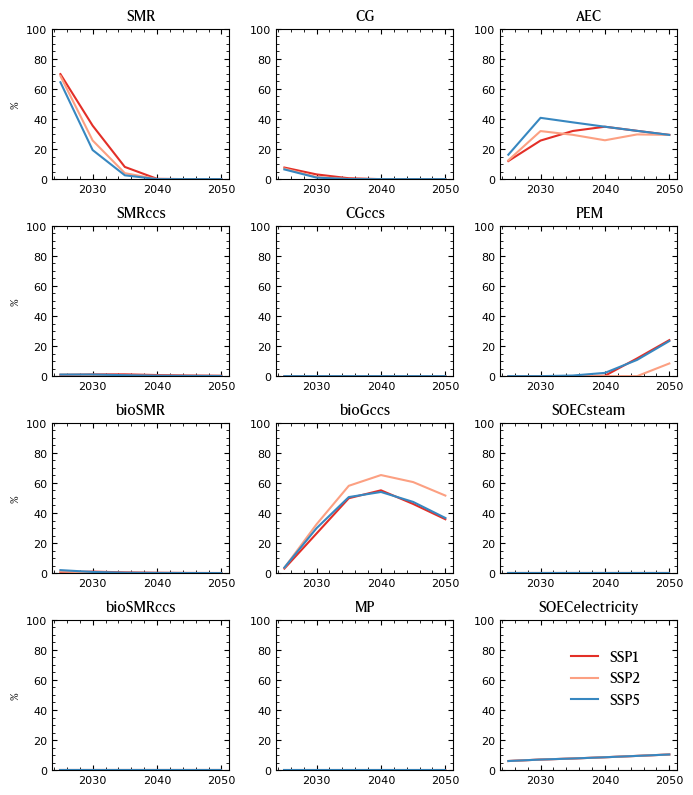

In [148]:
rcParams["axes.prop_cycle"] = plt.cycler("color",["#e32f27"
                                                "#fca082"
                                                "#3787c0"]);
fig, axs = plt.subplots(4,3,figsize=(7,8))

for (i,name) in enumerate(technamess)
    for (ssps,n) in enumerate(["SSP1","SSP2","SSP5"])
        # ratios = hcat([[x[2] for x in printChoices(s_med, 𝐀, YEAR=y, SSP=ssps, RCP=1)] for y in 1:6]...)
        mat1=hcat([[x[2] for x in printChoices(s_med, 𝐀, YEAR=y, SSP=ssps, RCP=1)] for y in 1:6]...)
        mat2=hcat([[x[2] for x in printChoices(s_med, 𝐁, YEAR=y, SSP=ssps, RCP=1)] for y in 1:6]...)
        ratios= vcat(mat1,mat2)
        if i==1
            axs[i].plot(2025:5:2050, (ratios)[i,:].*100,label=n)
        else
            axs[i].plot(2025:5:2050, (ratios)[i,:].*100)
        end
    end
    axs[i].set_title(name,fontproperties=font_prop,fontsize=8)
    axs[i].set_ylim(0,100)
end
for i in 1:4
    axs[i,1].set_ylabel("%",fontproperties=font_prop,fontsize=8)
end

# axs[end,end].remove()
fig.subplots_adjust(wspace=0.7)  
fig.subplots_adjust(hspace=0.5)

fig.legend(frameon=false,loc="upper left", bbox_to_anchor=(0.8, 0.2), ncol=1, prop=font_prop,fontsize=18)
plt.tight_layout()
# plt.savefig(respath*"H2contribs.svg",transparent=true)
# plt.savefig(respath*"H2contribs.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


#### ***3.4.1.2 Supply by processes***

In [149]:
s_med_not=opti(result_format=:scale,asos=:median,interactions=nothing,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_solar_electricity=c_solar_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            delta_slope_max=0.5,delta_slope_min=0,CCS=0);

s_med_bio=opti(result_format=:scale,asos=:median,interactions=:biophysical,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_solar_electricity=c_solar_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            delta_slope_max=0.5,delta_slope_min=0,CCS=0);

s_med_full=opti(result_format=:scale,asos=:median,interactions=:full,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_solar_electricity=c_solar_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            delta_slope_max=0.5,delta_slope_min=0,CCS=0);


In [150]:
set_color_palette(["#E0E0E0","#005f73","#0a9396","#94d2bd","#e9d8a6","#ee9b00","#ca6702","#bb3e03","#ae2012","#9b2226"][1:end-2],13,set_rcParam=true,show=false,rev=true);


Setting rcParams


In [192]:
set_color_palette(:tab20c,13,set_rcParam=true,show=true,rev=false);


Setting rcParams


In [ ]:
set_color_palette([
    "#3182bd"
    "#6baed6"
    "#9ecae1"
    "#c6dbef"
   
    "#636363"
    "#969696"
    "#bdbdbd"
    "#d9d9d9"
],12,set_rcParam=true,show=true,rev=false)




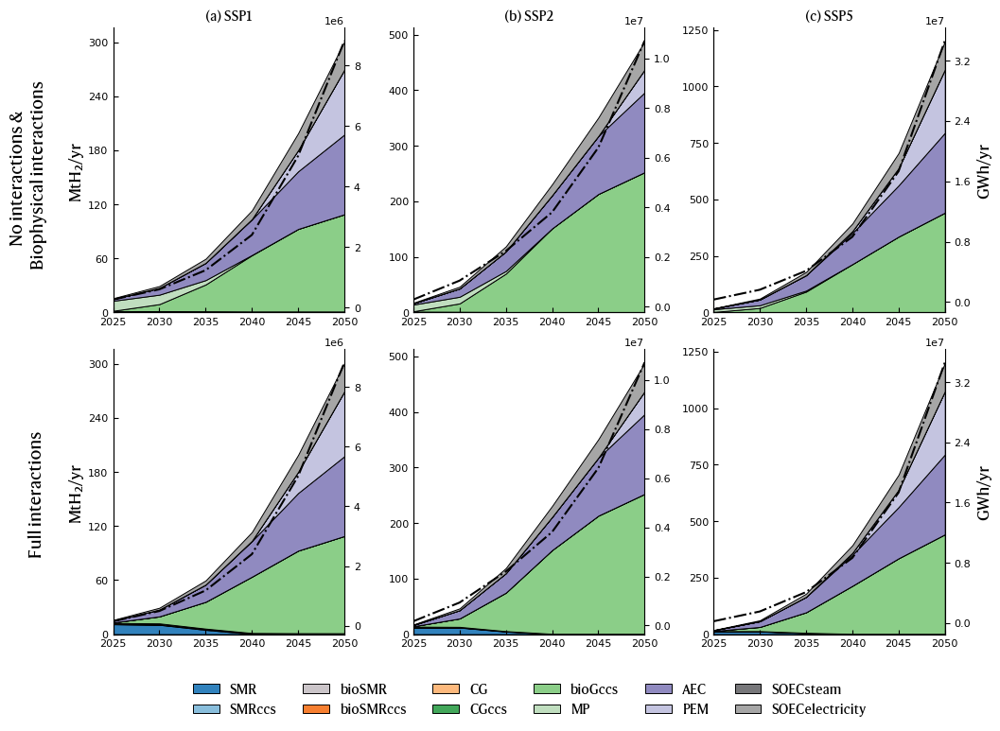

In [193]:
supply_MtH2 = Matrix(TotalMtH2)'
fig, axs = plt.subplots(2,3,sharex=false,figsize=(10, 7))#,sharey=true)
axsub=nothing
elctrolytic=9:12
bios=6:7

markerc="black"#orange"#"purple"
for (ind,s) in enumerate([s_med_not,s_med_bio])
    for (sspi,l) in zip(1:3,[technamess,nothing,nothing])
        ratios = hcat([[x[2] for x in printChoices(s, 𝐀, YEAR=y, SSP=sspi, RCP=1)] for y in 1:6]...)
        sup = ratios.* supply_MtH2[:, sspi]' #./sum(ratios,dims=1) #

        ratios_elec = hcat([[x[2] for x in printElec(s,y,sspi)] for y in 1:6]...) #kWh/kgH2
        # rnzd=sparse(ratios_elec) #this is to get the nonzero elements faster
        # msk=[i for i in 1:size(rnzd, 1) if !isempty(rnzd[i, :].nzind)] # we filter by rows
        # ratios_elec=rnzd[msk, :] # we apply the mask
        # sup = ratios./sum(ratios,dims=1)*100 # #GWh #(ratios.* supply_MtH2[:, sspi]').*1e3 #
        supplelec = sum((ratios_elec.* supply_MtH2[:, sspi]').*1e3,dims=1)  #GWh/MtH2
        
        if !isnothing(l) && ind==1
            axs[ind,sspi].stackplot(2025:5:2050, sup, labels=l,lw=0.7,edgecolor="k")
            ax2 = axs[ind,sspi].twinx()
            # elct=sum(ratios[elctrolytic,:],dims=1).*GW_Cap[sspi,:]'
            # biosum=sum(ratios[bios,:],dims=1).*GW_Cap[sspi,:]'
            # ax2.axline((2025,elct),(2050,elct),color="black",linestyle="--")
            ax2.plot(2025:5:2050,supplelec', lw=1.5, color=markerc,linestyle="-.")
            # ax2.plot(2025:5:2050,biosum',"#ee9b00",linestyle="-.")
            # ax2.scatter(2025:5:2050,elct' ,edgecolor=markerc, marker="p", lw=1, facecolors=markerc, s=35, alpha=0.75,label="Share \n electrolytic H₂")
            # ax2.scatter(2025:5:2050,elct' ,edgecolor=markerc, marker="p", lw=1, facecolors=markerc, s=35, alpha=0.75,label="Share \n electrolytic H₂")
            # ax2.plot(2025:5:2050,elct',"#ee9b00",label="Share \n electrolytic H₂",linestyle="--")
            ax2.spines["top"].set_visible(false)
            ax2.spines["right"].set_color(markerc)
            ax2.tick_params(axis="y", colors=markerc)
            ax2.yaxis.label.set_color(markerc)
            # ax2.set_ylim(-0.03,100)
            axsub=ax2
        else
            axs[ind,sspi].stackplot(2025:5:2050,  sup,lw=0.7,edgecolor="k")
            ax2 = axs[ind,sspi].twinx()
            elct=sum(ratios[elctrolytic,:],dims=1).*GW_Cap[sspi,:]'
            biosum=sum(ratios[bios,:],dims=1).*GW_Cap[sspi,:]'
            ax2.plot(2025:5:2050,supplelec', lw=1.5, color=markerc,linestyle="-.")
            # ax2.plot(2025:5:2050,biosum',"#ee9b00",linestyle="-.")
            ax2.spines["top"].set_visible(false)
            ax2.spines["right"].set_color(markerc)
            ax2.tick_params(axis="y", colors=markerc)
            ax2.yaxis.label.set_color(markerc)
            ax2.yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
            # axsub=ax2
            if (ind,sspi) == (1,3)||(ind,sspi) == (2,3) || (ind,sspi)== (3,3) || (ind,sspi)== (4,3) || (ind,sspi)== (5,3) || (ind,sspi)== (6,3)
                ax2.set_ylabel("GWh/yr", fontproperties=font_prop,fontsize=12)
            end
        end
    end
end

axs[1,1].set_title("(a) SSP1", fontproperties=font_prop,fontsize=19)
axs[1,2].set_title("(b) SSP2", fontproperties=font_prop,fontsize=19)
axs[1,3].set_title("(c) SSP5", fontproperties=font_prop,fontsize=19)


for i in 1:2
    axs[i,1].set_ylabel("MtH₂/yr", fontproperties=font_prop,fontsize=12)
end

for i in axs
    i.yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
end


fig.subplots_adjust(wspace=0.2)  
fig.subplots_adjust(hspace=0.2) 

for ax in axs
    ax.tick_params(axis="both", direction="in")
    ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
    ax.set_xlim(2025, 2050)
    # ax.set_ylim(-0.03,100)
end

fig.legend(frameon=false,loc="center", bbox_to_anchor=(0.5, -0.06), ncol=6, prop=font_prop,fontsize=18)


fig.text(-0.03, 0.73, "No interactions & \n Biophysical interactions", va="center",ha="center", rotation="vertical", fontproperties=font_prop, fontsize=13)

fig.text(-0.03, 0.25, "Full interactions", va="center", rotation="vertical", fontproperties=font_prop, fontsize=13)

plt.tight_layout()
display(plt.gcf())
# plt.savefig(respath*"contrib.svg", bbox_inches="tight",transparent=true)
# plt.savefig(respath*"contrib.pdf", bbox_inches="tight",transparent=true)
plt.close("all")


#### ***3.4.1.3 Required Capacities***

We can also investigate the required capacities. For this we have previously calculated capacities with an average capacity factor of 0.6.

In [155]:
printCapacity(s_med,3) #the number here indicates the SSP scenario


Row,process,2025,2030,2035,2040,2045,2050
,Any,Any,Any,Any,Any,Any,Any
1,SMR,75.9622,75.6771,29.0745,0.0264777,0.024871,0.0223131
2,SMRccs,1.25147,4.22096,7.1947,7.15735,7.04455,6.78011
3,bioSMR,2.35838,3.1068,3.0938,3.04901,2.93894,2.7174
4,bioSMRccs,0.0,0.0,0.0,0.0,0.0,0.0
5,CG,7.61655,3.99218,0.382684,0.00578175,0.00538538,0.00497315
6,CGccs,0.000935439,0.00119969,0.00160134,0.00160134,0.00160134,0.00160134
7,bioGccs,4.37687,116.945,575.555,1347.35,2120.28,2791.85
8,MP,0.0,0.0,0.0,0.0,0.0,0.0
9,AEC,19.1625,159.372,429.738,870.129,1437.6,2238.5


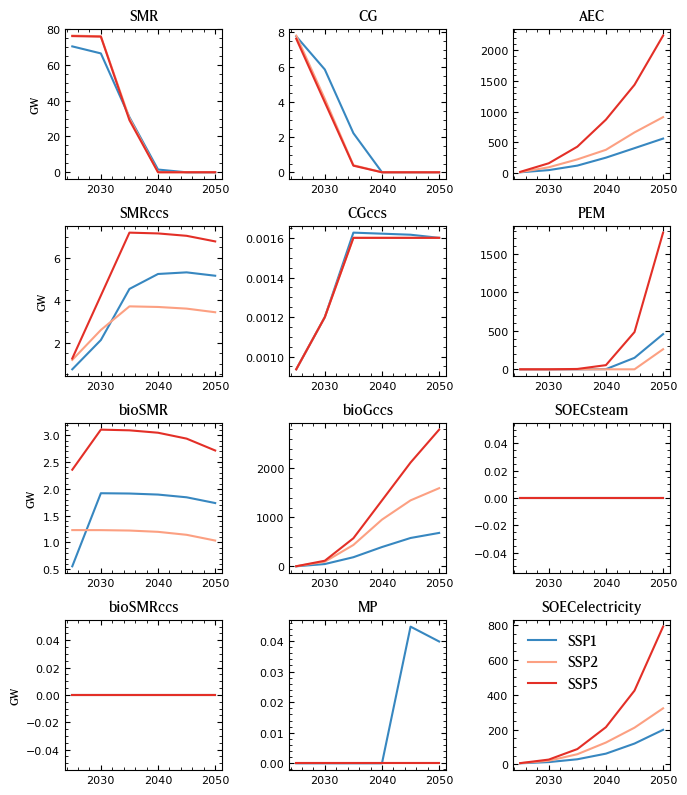

In [156]:
rcParams["axes.prop_cycle"] = plt.cycler("color",["#3787c0"
                                                "#fca082"
                                                "#e32f27"]);

fig, axs = plt.subplots(4,3,figsize=(7,8))

for (i,name) in enumerate(technamess)
    for (ssps,n) in enumerate(["SSP1","SSP2","SSP5"])
        ratios = hcat([[x[2] for x in printChoices(s_med, 𝐀, YEAR=y, SSP=ssps, RCP=1)] for y in 1:6]...)
        if i==1
            axs[i].plot(2025:5:2050, (ratios.*GW_Cap[ssps,:]')[i,:],label=n)
        else
            axs[i].plot(2025:5:2050, (ratios.*GW_Cap[ssps,:]')[i,:])
        end
    end
    axs[i].set_title(name,fontproperties=font_prop,fontsize=8)
    
end
for i in 1:4
    axs[i,1].set_ylabel("GW",fontproperties=font_prop,fontsize=8)
end

# axs[4,3].remove()
fig.subplots_adjust(wspace=0.7)  
fig.subplots_adjust(hspace=0.5)

fig.legend(frameon=false,loc="upper left", bbox_to_anchor=(0.75, 0.22), ncol=1, prop=font_prop,fontsize=18)

plt.tight_layout()
# plt.savefig(respath*"capacities.svg",transparent=true)
# plt.savefig(respath*"capacities.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


#### ***3.4.1.4 Electricity mix***

Here we separated wind and solar electricity as follows:

$$ E_{solar}r_{solar} = E_{wind}r_{wind}$$

$$ E_{solar}\frac{r_{solar}}{r_{wind}} = E_{wind}$$

In [2]:
s_med_not=opti(result_format=:scale,asos=:median,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_solar_electricity=c_solar_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            delta_slope_max=0.2,delta_slope_min=0,CCS=0,interactions=:nothing);

s_med_bio=opti(result_format=:scale,asos=:median,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_solar_electricity=c_solar_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            delta_slope_max=0.2,delta_slope_min=0,CCS=0,interactions=:biophysical);

s_med_full=opti(result_format=:scale,asos=:median,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_solar_electricity=c_solar_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            delta_slope_max=0.2,delta_slope_min=0,CCS=0,interactions=:full);


LoadError: UndefVarError: `c_nuclear_electricity` not defined

In [3]:
mask=vcat(printChoicesKeys(a1,YEAR=1, SSP=1));
push!(mask,getTcmKey("electricity production, photovoltaic, 570kWp open ground installation, multi-Si","RoW"))
printElec(s,yr,ssp)=[(electname((haskey(TCM(𝐏[yr,ssp])[:choice_map],i) ? TCM(𝐏[yr,ssp])[:choice_map][i].act : TCM(𝐏[yr,ssp])[:map][i].act) ) => k) for (i,k) in zip(sort(mask), s[yr,ssp][sort(mask)])]


LoadError: UndefVarError: `printChoicesKeys` not defined

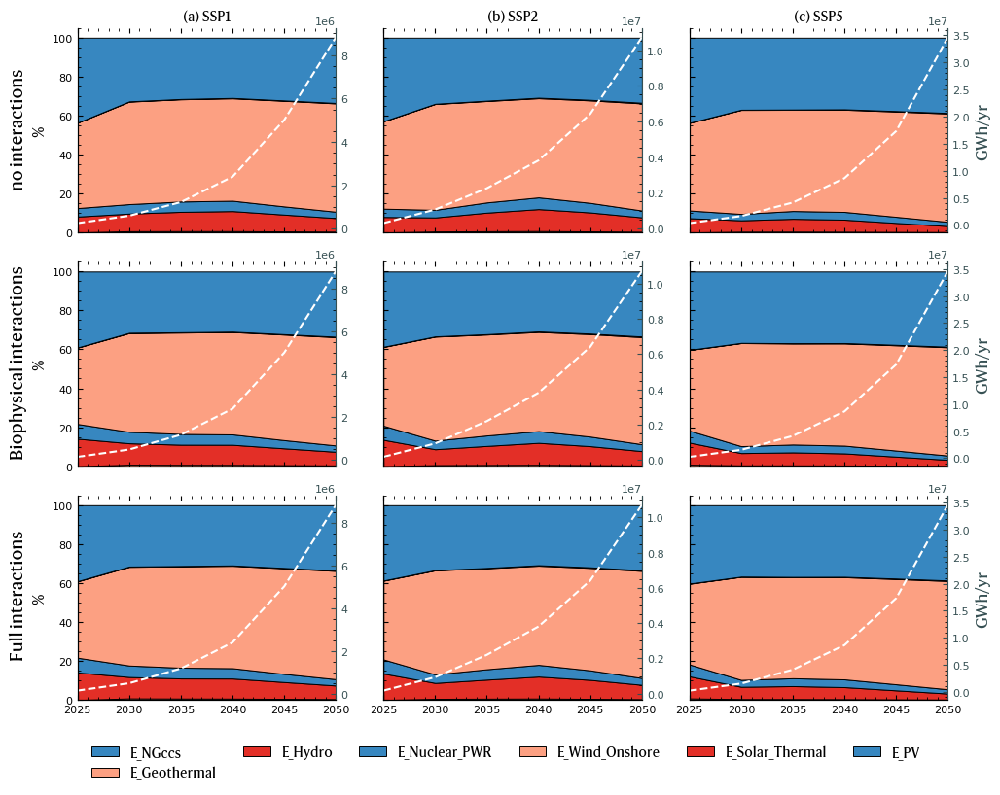

In [159]:
# set_color_palette(alternate_c[2:end-1],8,set_rcParam=true,show=false,rev=false)
supply_MtH2 = Matrix(TotalMtH2)'
fig, axs = plt.subplots(3,3,sharex=true,sharey=true,figsize=(10, 7.5))
axsub=nothing
elctrolytic=9:12


for (ind,s) in enumerate([s_med_not,s_med_bio,s_med_full])
    for (sspi,l) in zip(1:3,[[x[1] for x in printElec(s,1,1)],nothing,nothing])
        ratios = hcat([[x[2] for x in printElec(s,y,sspi)] for y in 1:6]...) #kWh/kgH2
        rnzd=sparse(ratios) #this is to get the nonzero elements faster
        msk=[i for i in 1:size(rnzd, 1) if !isempty(rnzd[i, :].nzind)] # we filter by rows
        ratios=rnzd[msk, :] # we apply the mask
        sup = ratios./sum(ratios,dims=1)*100 # #GWh #(ratios.* supply_MtH2[:, sspi]').*1e3 #
        supply = sum((ratios.* supply_MtH2[:, sspi]').*1e3,dims=1)  #GWh/MtH2
        if !isnothing(l) && ind==1
            axs[ind,sspi].stackplot(2025:5:2050,  sup, labels=vec([x[1] for x in printElec(s,1,1)][msk, :]),lw=0.7,edgecolor="k")

            ax2 = axs[ind,sspi].twinx()
            markerc="#354f52"#"#ee9b00"
            ax2.plot(2025:5:2050,supply',color="white",linestyle="--")#,edgecolor=markerc, marker="p", lw=1, facecolors=markerc, s=35, alpha=0.75,label="Share \n electrolytic H₂")
            # ax2.plot(2025:5:2050,elct',"#ee9b00",label="Share \n electrolytic H₂",linestyle="--")
            ax2.spines["top"].set_visible(false)
            ax2.spines["right"].set_color(markerc)
            ax2.tick_params(axis="y", colors=markerc)
            ax2.yaxis.label.set_color(markerc)
            ax2.tick_params(axis="both", direction="in")
            # ax2.set_ylim(-0.03,100)
            axsub=ax2
        else
            axs[ind,sspi].stackplot(2025:5:2050,   sup,lw=0.7,edgecolor="k")
            ax2 = axs[ind,sspi].twinx()
            markerc="#354f52"#"#ee9b00"
            ax2.plot(2025:5:2050,supply',color="white",linestyle="--")#,edgecolor=markerc, marker="p", lw=1, facecolors=markerc, s=35, alpha=0.75,label="Share \n electrolytic H₂")
            # ax2.plot(2025:5:2050,elct',"#ee9b00",label="Share \n electrolytic H₂",linestyle="--")
            ax2.spines["top"].set_visible(false)
            ax2.spines["right"].set_color(markerc)
            ax2.tick_params(axis="y", colors=markerc)
            ax2.yaxis.label.set_color(markerc)
            ax2.tick_params(axis="both", direction="in")
            if (ind,sspi) == (1,3)||(ind,sspi) == (2,3) || (ind,sspi)== (3,3) || (ind,sspi)== (4,3) || (ind,sspi)== (5,3) || (ind,sspi)== (6,3)
                ax2.set_ylabel("GWh/yr", fontproperties=font_prop,fontsize=12)
            end
        end
        
    end
end

axs[1,1].set_title("(a) SSP1", fontproperties=font_prop,fontsize=19)
axs[1,2].set_title("(b) SSP2", fontproperties=font_prop,fontsize=19)
axs[1,3].set_title("(c) SSP5", fontproperties=font_prop,fontsize=19)

for i in 1:3
    axs[i,1].set_ylabel("%", fontproperties=font_prop,fontsize=12)
end
fig.text(-0.01, 0.82, "no interactions", va="center", rotation="vertical", fontproperties=font_prop, fontsize=13)
fig.text(-0.01, 0.5, "Biophysical interactions", va="center", rotation="vertical", fontproperties=font_prop, fontsize=13)
fig.text(-0.01, 0.18, "Full interactions", va="center", rotation="vertical", fontproperties=font_prop, fontsize=13)
# axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=3))
# axs[1,2].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=3))
# axs[1,3].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=3))

fig.subplots_adjust(wspace=0.05)  
fig.subplots_adjust(hspace=0.2) 

for ax in axs
    ax.tick_params(axis="both", direction="in")
    ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
    ax.set_xlim(2025, 2050)
    # ax.set_ylim(-0.03,100)
end

fig.legend(frameon=false,loc="center", bbox_to_anchor=(0.5, -0.05), ncol=6, prop=font_prop,fontsize=18)

# fig.suptitle("Hydrogen \n production processes", fontproperties=font_prop, fontsize=12,x=0.74, y=0.43)
plt.tight_layout()
display(plt.gcf())
# plt.savefig(respath*"contrib_elect.svg", bbox_inches="tight",transparent=true)
# plt.savefig(respath*"contrib_elect.pdf", bbox_inches="tight",transparent=true)
plt.close("all")


### ***3.4.2. Contribution of processes***


In [160]:
res_contrib_med=opti(result_format=:contrib,asos=:median,interactions=:biophysical,
                    c_nuclear_electricity=c_nuclear_electricity,
                    c_wind_electricity=c_wind_electricity,
                    c_hydro_electricity=c_hydro_electricity,
                    c_solar_electricity=c_solar_electricity,
                    c_solar_PV_electricity=c_solar_PV_electricity,
                    delta_slope_max=0.9,delta_slope_min=0,CCS=0);
res_contrib_lower=opti(result_format=:contrib,asos=:lower,interactions=:biophysical,);
res_contrib_upper=opti(result_format=:contrib,asos=:upper,interactions=:biophysical,);


In [161]:
font_prop_legend = fm.FontProperties(fname="/Users/mickael/Library/Fonts/Harding Text Web Regular Regular.ttf",size=7);
cmap = PyPlot.get_cmap("tab20c")


In [162]:
rcParams["ytick.right"] = false
rcParams["xtick.top"] = false
rcParams["xtick.bottom"] = true
rcParams["ytick.direction"] = "in"
rcParams["ytick.minor.visible"] = true
rcParams["xtick.direction"] = "out"
rcParams["xtick.minor.visible"] = false
rcParams["figure.facecolor"] = "white"
for rcpi in 1:1
    for sspi in 1:3
        for yeari in 1:6
            mm=(res_contrib_med[yeari,sspi]./sum(res_contrib_med[yeari,sspi], dims=2));
            indices=unique(vcat([findall(x -> x > 0.05, mm[i,:]) for i in 1:10]...))
            rest=sum(mm,dims=2).-sum(mm[:,indices],dims=2)
            mm1=hcat(mm[:,indices],rest).*100
            

            labels=[getTcmAct(i,yeari,sspi).act for i in indices]
            labels=vcat(labels, "Others")
            co= [cmap(i) for i in 1:length(labels)] 
            
            fig, ax = subplots(figsize=(12, 6))

            bottom_pos = zeros(size(mm1, 1))
            bottom_neg = zeros(size(mm1, 1))
            bar_width = 0.9
            
            for (i,l,c) in zip(1:size(mm1, 2),labels,co)
                pos_values = ifelse.(mm1[:, i] .> 0, mm1[:, i], 0)
                neg_values = ifelse.(mm1[:, i] .< 0, mm1[:, i], 0)
                
                ax.bar(1:10, pos_values, bottom=bottom_pos, label=l, edgecolor="black",lw=0.8,zorder=1,width=bar_width,color=c)
                ax.bar(1:10, neg_values, bottom=bottom_neg, edgecolor="black",lw=0.8,zorder=1,width=bar_width,color=c)
                ax.spines["top"].set_visible(false)
                ax.spines["right"].set_visible(false)
                bottom_pos .+= pos_values
                bottom_neg .+= neg_values
                ax.set_ylabel("%",fontproperties=font_prop_labels)
                ax.set_xticks(1:10)
                ax.set_xticklabels(wrapped_names,fontproperties=font_prop_ticks)
            end

            plt.legend(loc="lower center", bbox_to_anchor=(0.5, -0.35), frameon=false, prop=font_prop_legend, ncol=2)

            plt.savefig("process_contrib-year_$(2020+(5*yeari)).pdf", bbox_inches="tight",transparent=true)
            plt.savefig("process_contrib-year_$(2020+(5*yeari)).svg", bbox_inches="tight",transparent=true)
            plt.close()
        end
    end
end 
rcParams["ytick.right"] = false
rcParams["xtick.top"] = false
rcParams["xtick.bottom"] = true
rcParams["ytick.direction"] = "out"
rcParams["ytick.minor.visible"] = false
rcParams["xtick.direction"] = "out"
rcParams["xtick.minor.visible"] = false
rcParams["figure.facecolor"] = "white"


"white"

export of the data to excel files

In [ ]:
function expt_excel(;cutoff=0.05)
    for ssp in 1:3
        filename = string(respath, "SSP", ssp, "/contrib_results_H-PBI.xlsx")
        if isfile(filename)
            rm(filename)
        end
        for yr in 1:6
            sheetname = string("year ", 2020 + 5 * yr)
            mm = (res_contrib_med[yr, ssp] ./ sum(res_contrib_med[yr, ssp], dims=2))
            indices = unique(vcat([findall(x -> x > cutoff, mm[i, :]) for i in 1:10]...))
            rest = sum(mm, dims=2) .- sum(mm[:, indices], dims=2)
            mm1 = hcat(mm[:, indices], rest).*100
            labels = [getTcmAct(i, yr, 1).act for i in indices]
            labels = vcat(labels, "Others")
            df_res = DataFrame(hcat(labels, mm1'), :auto)
            rename!(df_res, vcat("Activities", catnames.*" [%]"))
            df_res = combine(groupby(df_res, :Activities), names(df_res, Not(:Activities)) .=> sum)

            for col in names(df_res)
                if endswith(string(col), "_sum")
                    rename!(df_res, col => Symbol(replace(string(col), "_sum" => "")))
                end
            end
            if isfile(filename)
                XLSX.openxlsx(filename, mode="rw") do xf
                    if sheetname in XLSX.sheetnames(xf)
                        deletesheet!(xf, sheetname)  # Remove existing sheet if you want to replace it
                    end
                    ws = XLSX.addsheet!(xf, sheetname)
                    XLSX.writetable!(ws, Tables.columntable(df_res))
                end
            else
                XLSX.writetable(filename, Tables.columntable(df_res), sheetname=sheetname)
            end
        end
    end
end
expt_excel()


### ***3.4.3. Planetary footprint***

In [163]:
# pushfirst!(pyimport("sys")."path", "/Users/mickael/Library/CloudStorage/OneDrive-UNSW/Research/Data management/lca/src/python_modules/");
pushfirst!(pyimport("sys")."path", "./planetary-boundaries-visualisation/source");
pb30 = pyimport("PB30");


In [164]:
function expt_ASR_excel(ASR,ssp,scenar,range=["median","5th percentile","95th percentile"])
    filename = string(respath, "SSP", ssp, "/$(scenar)_ASR_results.xlsx")
    if isfile(filename)
        rm(filename)
    end
    for (asr,sc) in zip(ASR,range)
        df_ASR_res=DataFrame(hcat(catnames,hcat(asr[:,ssp]...)),:auto)
        rename!(df_ASR_res, [:Boundary, (Symbol(i) for i in 2025:5:2050)...])
        
        if isfile(filename)
            XLSX.openxlsx(filename, mode="rw") do xf
                if sc in XLSX.sheetnames(xf)
                    deletesheet!(xf, sc) 
                end
                ws = XLSX.addsheet!(xf, sc)
                XLSX.writetable!(ws, Tables.columntable(df_ASR_res))
            end
        else
            XLSX.writetable(filename, Tables.columntable(df_ASR_res), sheetname=sc)
        end

    end
end


expt_ASR_excel (generic function with 2 methods)

#### ***3.4.3.1 full interations (human feedback)***

In [165]:
ASR_med=opti(result_format=:ASR,asos=:median,interactions=:full,CCS=0);
ASR_lower=opti(result_format=:ASR,asos=:lower,interactions=:full,CCS=0);
ASR_upper=opti(result_format=:ASR,asos=:upper,interactions=:full,CCS=0);
# for ssp in 1:3
#     expt_ASR_excel([ASR_med,ASR_lower,ASR_upper],ssp,"H-PBI")
# end


6×3 Matrix{Vector{Float64}}:
 [52.0726, 53.9974, 22.6987, -23.0796, 9.95809, 32.3497, 32.3497, 17.3833, 77.0099, 30.9609]  …  [49.5499, 51.3657, 21.6081, -21.8953, 9.51793, 31.0243, 31.0243, 16.5387, 73.6347, 29.5663]
 [35.7778, 36.8774, 16.1653, -15.3971, 7.99911, 26.2472, 26.2472, 11.8196, 59.4924, 24.8373]     [28.0491, 28.7207, 12.6871, -11.7365, 6.75968, 25.8468, 25.8468, 9.25162, 54.0284, 20.9653]
 [24.1339, 24.6023, 11.6841, -9.87618, 6.91179, 22.6113, 22.6113, 7.80474, 48.2973, 21.4626]     [21.564, 21.8807, 10.4922, -8.66464, 6.48865, 22.9469, 22.9469, 6.95697, 47.0733, 20.1441]
 [20.6368, 20.9139, 10.2611, -8.23352, 6.50699, 21.9187, 21.9187, 6.61368, 45.3592, 20.2142]     [20.4996, 20.7625, 10.1357, -8.17855, 6.44051, 22.4256, 22.4256, 6.57973, 45.8719, 20.0075]
 [19.6796, 19.9041, 9.43699, -7.84925, 5.93132, 23.403, 23.403, 6.37142, 46.1581, 18.4351]       [19.8042, 20.0332, 9.54128, -7.9074, 6.01726, 23.3669, 23.3669, 6.40319, 46.2698, 18.7008]
 [18.6907, 18.8646, 8.55995,

In [187]:
df_ASR_res=DataFrame(hcat(catnames,hcat(ASR_med[:,1]...)),:auto)
rename!(df_ASR_res, [:Boundary, (Symbol(i) for i in 2025:5:2050)...])
df_ASR_res


Row,Boundary,2025,2030,2035,2040,2045,2050
,Any,Any,Any,Any,Any,Any,Any
1,Energy Imbalance,69.7857,47.9481,32.3434,27.6566,26.3738,25.0486
2,CO2 Concentration,72.3653,49.4216,32.971,28.028,26.6746,25.2815
3,Ocean Acidification,30.42,21.6641,15.6586,13.7515,12.6471,11.4717
4,Atmospheric Aerosol Loading,-30.9304,-20.6346,-13.2357,-11.0342,-10.5193,-10.0009
5,Freshwater Use,13.3454,10.7201,9.26292,8.72041,7.94892,7.10096
6,Biogeochemical Flows P,43.3538,35.1755,30.3028,29.3746,31.3638,33.3542
7,Biogeochemical Flows N,43.3538,35.1755,30.3028,29.3746,31.3638,33.3542
8,Stratospheric Ozone Depletion,23.2964,15.8402,10.4596,8.8634,8.53873,8.21038
9,Land-System Change,103.206,79.7294,64.7262,60.7886,61.8592,62.8198


In [155]:
pb2 = pyimport("PB29")


PyObject <module 'PB29' from '/Users/mickael/Library/CloudStorage/OneDrive-UNSW/Research/Publications/Journal articles/1_Natcoms/Submission/code/./planetary-boundaries-visualisation/source/PB29.py'>

In [167]:
ASR_med[:,1]
ASR_lower[:,1]
ASR_upper[:,1]


6-element Vector{Vector{Float64}}:
 [52.07263545171502, 53.99744608916071, 22.69873210942047, -23.079615397775175, 9.958086032620294, 32.34969035243177, 32.34969035243177, 17.383278763404242, 77.00986366400473, 30.960888066419706]
 [35.777828469596066, 36.877379789821354, 16.165307391069515, -15.397112806197866, 7.999111131307692, 26.24721030758321, 26.24721030758321, 11.819616760245323, 59.492401233593164, 24.83734000253942]
 [24.133928846014705, 24.60229397816847, 11.684084514738965, -9.876182742265678, 6.911791975974287, 22.611281941037202, 22.611281941037202, 7.804735486035889, 48.297309602723715, 21.462635454544948]
 [20.6368015403598, 20.913890151818602, 10.261064885774026, -8.233520056267656, 6.506987025852883, 21.918737652201848, 21.918737652201848, 6.613680665087912, 45.35919967502106, 20.21421179123187]
 [19.679567950259273, 19.904052029146346, 9.436991046511789, -7.849249981156761, 5.931318924789753, 23.40301886805579, 23.40301886805579, 6.3714204231275415, 46.15805886352920

In [168]:
categories=["Energy  Imbalance",
            "CO2  Concentration",
            "Ocean  Acidification",
            "Atmospheric  Aerosol  Loading",
            "Freshwater  Use",
            "Biogeochemical  Flows  P",
            "Biogeochemical  Flows  N",
            "Stratospheric  Ozone  Depletion",
            "Land-System  Change",
            "Biosphere  Integrity"
            ]

fig=pb30.PBchartm(categories=categories,
                    values=ASR_med[:,1],upper=ASR_lower[:,1],lower=ASR_upper[:,1], 
                    legend=["2025","2030","2035","2040","2045","2050"],
                    figsize=(6,6),
                    offsetcat=0,scale=7,minscale=-4,median_lw=0.8)
    
    fig.savefig("ASR_interact.svg",dpi=800, bbox_inches="tight",transparent=true)
    fig.savefig("ASR_interact.pdf", bbox_inches="tight",transparent=true)

display(plt.gcf())
plt.close("all")


KeyError: KeyError: key :savefig not found

#### ***3.4.3.2 Biophysical interactions only***

In [169]:
ASR_med_bio=opti(result_format=:ASR,asos=:median,interactions=:biophysical,CCS=0);
ASR_lower_bio=opti(result_format=:ASR,asos=:lower,interactions=:biophysical,CCS=0);
ASR_upper_bio=opti(result_format=:ASR,asos=:upper,interactions=:biophysical,CCS=0);
# for ssp in 1:3
#     expt_ASR_excel([ASR_med_bio,ASR_lower_bio,ASR_upper_bio],ssp,"B-PBI")
# end


6×3 Matrix{Vector{Float64}}:
 [37.0725, 38.664, 19.6445, -20.0987, 7.83272, 30.8037, 30.8037, -4.07684, 15.7113, 25.6614]   …  [35.2458, 36.7472, 18.6878, -19.0453, 7.48988, 29.5476, 29.5476, -3.87582, 14.9681, 24.4996]
 [24.7186, 25.6278, 13.8073, -13.0973, 6.43773, 25.0823, 25.0823, -2.71788, 11.6405, 20.7553]     [18.8369, 19.3922, 10.547, -9.6508, 5.41664, 24.8168, 24.8168, -2.07056, 9.28795, 17.2702]
 [15.7051, 16.0924, 9.77132, -8.01239, 5.73373, 21.6982, 21.6982, -1.72648, 8.99192, 18.162]      [13.7237, 13.9855, 8.62856, -6.84939, 5.37333, 22.0692, 22.0692, -1.50839, 8.17542, 16.9324]
 [13.005, 13.2341, 8.46531, -6.48446, 5.43653, 21.0744, 21.0744, -1.42947, 8.10599, 17.1199]      [12.8872, 13.1047, 8.3198, -6.40997, 5.36355, 21.5739, 21.5739, -1.41648, 7.99541, 16.8792]
 [12.36, 12.5456, 7.60956, -6.06973, 4.86054, 22.5522, 22.5522, -1.35852, 7.34705, 15.2893]       [12.4303, 12.6197, 7.70987, -6.12406, 4.94315, 22.5126, 22.5126, -1.36624, 7.44731, 15.5477]
 [11.7149, 11.8586,

In [170]:
for ssps in 1:3
    pbchart= pb.PBchart(categories=categories,
                    values=ASR_med_bio[:,ssps],upper=ASR_lower_bio[:,ssps],lower=ASR_upper_bio[:,ssps], 
                    legend=["2025","2030","2035","2040","2045","2050"],
                    figsize=(6,6),
                    offsetcat=0,scale=7,minscale=-4,median_lw=0.8
                    ) 
    fig = pbchart
    # fig.savefig(respath*"SSP$ssps/ASR_biophysical.svg",dpi=800, bbox_inches="tight",transparent=true)
    # fig.savefig(respath*"SSP$ssps/ASR_biophysical.pdf", bbox_inches="tight",transparent=true)
end
display(plt.gcf())
plt.close()


UndefVarError: UndefVarError: `pb` not defined

In [160]:
fig.savefig("./ASR_interact.png",dpi=800, bbox_inches="tight",transparent=true)


KeyError: KeyError: key :savefig not found

#### ***3.4.3.3 no interactions***

In [161]:
ASR_med_noI=opti(result_format=:ASR,asos=:median,interactions=nothing,CCS=0);
ASR_lower_noI=opti(result_format=:ASR,asos=:lower,interactions=nothing,CCS=0);
ASR_upper_noI=opti(result_format=:ASR,asos=:upper,interactions=nothing,CCS=0);

# for ssp in 1:3
#     expt_ASR_excel([ASR_med_noI,ASR_lower_noI,ASR_upper_noI],ssp,"N-PBI")
# end


6×3 Matrix{Vector{Float64}}:
 [14.4046, 14.9994, 4.82827, 3.7723, 0.0255206, 41.4044, 1.05077, 0.00157505, 0.0156289, 1.60452]    …  [13.9131, 14.4881, 4.66626, 3.56451, 0.0338093, 39.0485, 1.03957, 0.00161918, 0.0184114, 1.64047]
 [9.49049, 9.86761, 3.26296, 2.33475, 0.0323567, 27.8374, 0.86663, 0.00139628, 0.115741, 4.6606]        [7.0065, 7.26096, 2.44004, 1.76188, 0.0537756, 24.031, 0.86239, 0.00160141, 0.130717, 5.05812]
 [5.99416, 6.22583, 2.17725, 1.14474, 0.0297572, 17.5626, 0.713811, 0.00113981, 0.216534, 7.86209]      [5.11786, 5.30559, 1.8865, 0.949723, 0.0382483, 16.7211, 0.729628, 0.00123672, 0.219834, 7.94944]
 [4.91258, 5.09769, 1.83629, 0.807833, 0.0292023, 15.0579, 0.670008, 0.00108281, 0.239485, 8.57179]     [4.79011, 4.96797, 1.79124, 0.806921, 0.032432, 15.5497, 0.694566, 0.00111267, 0.23466, 8.42249]
 [4.44742, 4.59922, 1.64791, 0.851861, 0.0398842, 17.028, 0.706814, 0.00108046, 0.200901, 7.24522]      [4.4645, 4.6194, 1.65715, 0.836947, 0.0390912, 16.8986, 0.71311

In [162]:
"hydrogen production, gaseous, 100 bar, from methane pyrolysis" => "MP",
"hydrogen production, coal gasification" => "CG",
"hydrogen production, steam methane reforming" => "SMR",
"hydrogen production, coal gasification, with CCS" => "CGccs",
"hydrogen production, gaseous, 1 bar, from SOEC electrolysis, from choice electricity" => "SOECelectricity",
"hydrogen production, steam methane reforming, from biomethane, with CCS" => "bioSMRccs",
"hydrogen production, gaseous, 30 bar, from PEM electrolysis, from choice electricity" => "PEM",
"hydrogen production, gaseous, 20 bar, from AEC electrolysis, from choice electricity" => "AEC",
"hydrogen production, steam methane reforming, with CCS" => "SMRccs",
"hydrogen production, steam methane reforming, from biomethane" => "bioSMR",
"hydrogen production, gaseous, 1 bar, from SOEC electrolysis, with steam input, from choice electricity" => "SOECsteam",
"hydrogen production, gaseous, 25 bar, from gasification of woody biomass in entrained flow gasifier, with CCS, at gasification plant"=>"bioGccs",   
"carbon dioxide, captured from atmosphere and stored, with a solvent-based direct air capture system, 1MtCO2, with industrial steam heat, and grid electricity"=>"CC_steam",
"carbon dioxide, captured from atmosphere and stored, with a solvent-based direct air capture system, 1MtCO2, with heat pump heat, and grid electricity"=>"CC_HP"


("hydrogen production, gaseous, 100 bar, from methane pyrolysis" => "MP", "hydrogen production, coal gasification" => "CG", "hydrogen production, steam methane reforming" => "SMR", "hydrogen production, coal gasification, with CCS" => "CGccs", "hydrogen production, gaseous, 1 bar, from SOEC electrolysis, from choice electricity" => "SOECelectricity", "hydrogen production, steam methane reforming, from biomethane, with CCS" => "bioSMRccs", "hydrogen production, gaseous, 30 bar, from PEM electrolysis, from choice electricity" => "PEM", "hydrogen production, gaseous, 20 bar, from AEC electrolysis, from choice electricity" => "AEC", "hydrogen production, steam methane reforming, with CCS" => "SMRccs", "hydrogen production, steam methane reforming, from biomethane" => "bioSMR", "hydrogen production, gaseous, 1 bar, from SOEC electrolysis, with steam input, from choice electricity" => "SOECsteam", "hydrogen production, gaseous, 25 bar, from gasification of woody biomass in entrained flow gas

In [163]:
biomass=getAct("hydrogen production, gaseous, 25 bar, from gasification of woody biomass in entrained flow gasifier, with CCS, at gasification plant","World")
smrprocess=getAct("hydrogen production, steam methane reforming","World");


In [164]:
Dict(
    "electricity production, peat" => "E_Peat",
    "electricity production, lignite" => "E_Lignite",
    "electricity production, wind, >3MW turbine, onshore" => "E_Wind_Onshore",
    "electricity production, deep geothermal" => "E_Geothermal",
    "electricity production, solar thermal parabolic trough, 50 MW" => "E_Solar_Thermal",
    "electricity production, at lignite-fired IGCC power plant" => "E_Lignite_IGCC",
    "electricity production, natural gas, 10MW" => "E_Gas_10MW",
    "electricity production, hydro, reservoir, tropical region" => "E_Hydro_Tropical",
    "electricity production, oil" => "E_Oil",
    "electricity production, hard coal" => "E_Coal",
    "electricity production, hard coal, supercritical" => "E_Coal_SC",
    "electricity production, nuclear, pressure water reactor" => "E_Nuclear_PWR",
    "electricity production, from hydrogen-fired one gigawatt gas turbine" => "E_Hydrogen_1GW",
    "electricity production, wood, future" => "E_Wood_Future",
    "electricity production, at natural gas-fired combined cycle power plant, post, pipeline 200km, storage 1000m" => "E_NGccs",
    "electricity production, nuclear, boiling water reactor" => "E_Nuclear_BWR",
    "electricity production, hydro, run-of-river" => "E_Hydro",
    "electricity production, nuclear, pressure water reactor, heavy water moderated" => "E_Nuclear_PWR_HWM",
    "electricity production, photovoltaic, 570kWp open ground installation, multi-Si"=> "E_PV")


Dict{String, String} with 19 entries:
  "electricity production, nuclear, pressure water react… => "E_Nuclear_PWR"
  "electricity production, lignite"                       => "E_Lignite"
  "electricity production, at natural gas-fired combined… => "E_NGccs"
  "electricity production, at lignite-fired IGCC power p… => "E_Lignite_IGCC"
  "electricity production, from hydrogen-fired one gigaw… => "E_Hydrogen_1GW"
  "electricity production, photovoltaic, 570kWp open gro… => "E_PV"
  "electricity production, hard coal"                     => "E_Coal"
  "electricity production, nuclear, pressure water react… => "E_Nuclear_PWR_HWM"
  "electricity production, peat"                          => "E_Peat"
  "electricity production, natural gas, 10MW"             => "E_Gas_10MW"
  "electricity production, oil"                           => "E_Oil"
  "electricity production, hydro, run-of-river"           => "E_Hydro"
  "electricity production, wind, >3MW turbine, onshore"   => "E_Wind_Onshore"
  "e

In [165]:
for ssps in 1:3
    pbchart= pb.PBchartm(categories=categories,
                    values=ASR_med_noI[:,ssps],upper=ASR_lower_noI[:,ssps],lower=ASR_upper_noI[:,ssps], 
                    legend=["2025","2030","2035","2040","2045","2050"],
                    figsize=(6,6),
                    offsetcat=0,scale=7,minscale=-4,median_lw=0.8
                    ) 
    fig = pbchart.chart
    fig.savefig(respath*"SSP$ssps/ASR_no_interactions.svg",dpi=800, bbox_inches="tight",transparent=true)
    fig.savefig(respath*"SSP$ssps/ASR_no_interactions.pdf",dpi=800, bbox_inches="tight",transparent=true)
end
display(plt.gcf())
plt.close()


UndefVarError: UndefVarError: `pb` not defined

#### ***3.4.3.4 mosaic plot***

In [171]:
ni=hcat(ASR_med_noI[:,1]...)
bi=hcat(ASR_med_bio[:,1]...)
full=hcat(ASR_med[:,1]...)

df=DataFrame((((bi.-ni)./ni)*100)',:auto)
rename!(df, categories)


UndefVarError: UndefVarError: `ASR_med_noI` not defined

In [167]:
df=DataFrame((((full.-bi)./bi)*100)',:auto)
rename!(df, categories)


Row,Energy Imbalance,CO2 Concentration,Ocean Acidification,Atmospheric Aerosol Loading,Freshwater Use,Biogeochemical Flows P,Biogeochemical Flows N,Stratospheric Ozone Depletion,Land-System Change,Biosphere Integrity
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,32.7772,31.6246,22.9705,33.8566,38.7326,8.75164,8.75164,-327.588,283.12,34.5144
2,35.2814,34.1991,23.7763,37.2887,33.0708,7.61567,7.61567,-296.747,288.995,30.8771
3,40.0664,39.2171,24.7965,43.9791,25.8004,6.22004,6.22004,-232.698,291.715,25.8131
4,43.6493,42.9763,26.075,49.0231,24.0523,5.71039,5.71039,-195.953,304.483,24.8492
5,48.8611,48.2095,30.8186,55.7211,28.2429,5.61848,5.61848,-187.81,372.554,29.5544
6,54.7811,54.1754,37.1022,63.5373,34.0875,5.55874,5.55874,-180.309,461.864,36.0766


In [168]:
df=DataFrame(ni',:auto)
rename!(df, categories)


Row,Energy Imbalance,CO2 Concentration,Ocean Acidification,Atmospheric Aerosol Loading,Freshwater Use,Biogeochemical Flows P,Biogeochemical Flows N,Stratospheric Ozone Depletion,Land-System Change,Biosphere Integrity
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,19.3045,20.1016,6.47067,5.05549,0.0342017,55.4886,1.4082,0.00211082,0.0209452,2.15031
2,12.7188,13.2242,4.37289,3.12894,0.0433631,37.3066,1.16142,0.00187124,0.155112,6.24595
3,8.03314,8.34362,2.91787,1.53414,0.0398795,23.5367,0.956621,0.00152753,0.29019,10.5365
4,6.58365,6.83172,2.46093,1.08263,0.0391358,20.18,0.897919,0.00145114,0.320949,11.4876
5,5.96027,6.1637,2.20847,1.14163,0.0534513,22.8203,0.947245,0.00144799,0.26924,9.70977
6,5.34345,5.501,1.95097,1.21145,0.0690149,25.6203,0.9945,0.0014573,0.211091,7.71126


In [169]:
df=DataFrame(bi',:auto)
rename!(df, categories)



Row,Energy Imbalance,CO2 Concentration,Ocean Acidification,Atmospheric Aerosol Loading,Freshwater Use,Biogeochemical Flows P,Biogeochemical Flows N,Stratospheric Ozone Depletion,Land-System Change,Biosphere Integrity
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,49.6831,51.816,26.3268,-26.9356,10.4971,41.2819,41.2819,-5.46362,21.0556,34.3904
2,33.1269,34.3454,18.504,-17.5525,8.6276,33.6144,33.6144,-3.6424,15.6002,27.8155
3,21.0474,21.5664,13.0951,-10.7379,7.68412,29.0791,29.0791,-2.31376,12.0506,24.34
4,17.4288,17.7358,11.3449,-8.69023,7.28583,28.2432,28.2432,-1.91572,10.8633,22.9434
5,16.5644,16.8131,10.198,-8.13442,6.51391,30.2236,30.2236,-1.82063,9.84623,20.4902
6,15.6999,15.8925,8.9855,-7.58051,5.66784,32.2049,32.2049,-1.72553,8.7518,17.8066


In [170]:
axd = plt.figure(figsize=(10,10),layout="constrained").subplot_mosaic(
                "AC
                 BC",
                #  DEF
                #  GHI",
                 # set the height ratios between the rows
                # height_ratios=[1,1],
                # # set the width ratios between the columns
                # width_ratios=[1,1, 1],
                # subplot_kw=Dict("projection"=> "polar"),
                per_subplot_kw=Dict(
                                "A" => Dict("projection"=> "polar"),
                                "B" => Dict("projection"=> "polar"),
                                "C" => Dict("projection"=> "polar"))
)

categories=["Energy  Imbalance",
            "CO2  Concentration",
            "Ocean  Acidification",
            "Atmospheric  Aerosol  Loading",
            "Freshwater  Use",
            "Biogeochemical  Flows  P",
            "Biogeochemical  Flows  N",
            "Stratospheric  Ozone  Depletion",
            "Land-System  Change",
            "Biosphere  Integrity"
            ]
categories_S=["EI",
            "[CO2]",
            "OA",
            "AAL",
            "FWU",
            "PBF",
            "NBF",
            "SOD",
            "LSC",
            "BI"
            ]

sss=[[ASR_med_noI,ASR_lower_noI,ASR_upper_noI],
    [ASR_med_bio,ASR_lower_bio,ASR_upper_bio],
    [ASR_med,ASR_lower,ASR_upper]]

hdls=nothing
for (s,a) in zip(sss,["A","B","C"])
    pbchart= pb30.PBchartm(categories=categories,
                    values=s[1][:,1],lower=s[3][:,1],upper=s[2][:,1], 
                    legend=["2025","2030","2035","2040","2045","2050"],
                    figsize=(8,8),
                    offsetcat=0,scale=7,minscale=-4,median_lw=0.8,axis=axd[a]
                    ) 
    ax,hdl = pbchart.chart
    if a == "C"
        hdls=hdl
    end
end

axd["C"].legend(handles=hdls, loc="center", bbox_to_anchor=(0.5,-0.5),prop=font_prop_titles,frameon=false,ncol=2)
axd["A"].set_title("(a) No interactions",fontproperties=font_prop_titles,fontsize=30,pad=30)
axd["B"].set_title("(b) Biophysical interactions",fontproperties=font_prop_titles,fontsize=30,pad=30)
axd["C"].set_title("(c) Full interactions",fontproperties=font_prop_titles,fontsize=30,pad=30)

# axd["A"].set_ylabel("SSP1",fontproperties=font_prop,fontsize=13)

# plt.tight_layout()
# plt.savefig(respath*"ASR_mosaic.svg",transparent=true)
# plt.savefig(respath*"ASR_mosaic.pdf",transparent=true)
display(plt.gcf())
plt.close()


Figure(PyObject <Figure size 1000x1000 with 3 Axes>)

Relative change with other SSPs

In [171]:
δASR12_noI= [x./y for (x,y) in zip((ASR_med_noI[:,2].-ASR_med_noI[:,1]),ASR_med_noI[:,1])]
δASR13_noI= [x./y for (x,y) in zip((ASR_med_noI[:,3].-ASR_med_noI[:,1]),ASR_med_noI[:,1])]

δASR12_bio= [x./y for (x,y) in zip((ASR_med_bio[:,2].-ASR_med_bio[:,1]),ASR_med_bio[:,1])]
δASR13_bio= [x./y for (x,y) in zip((ASR_med_bio[:,3].-ASR_med_bio[:,1]),ASR_med_bio[:,1])]

δASR12 = [x./y for (x,y) in zip((ASR_med[:,2].-ASR_med[:,1]),ASR_med[:,1])]
δASR13 = [x./y for (x,y) in zip((ASR_med[:,3].-ASR_med[:,1]),ASR_med[:,1])]
;


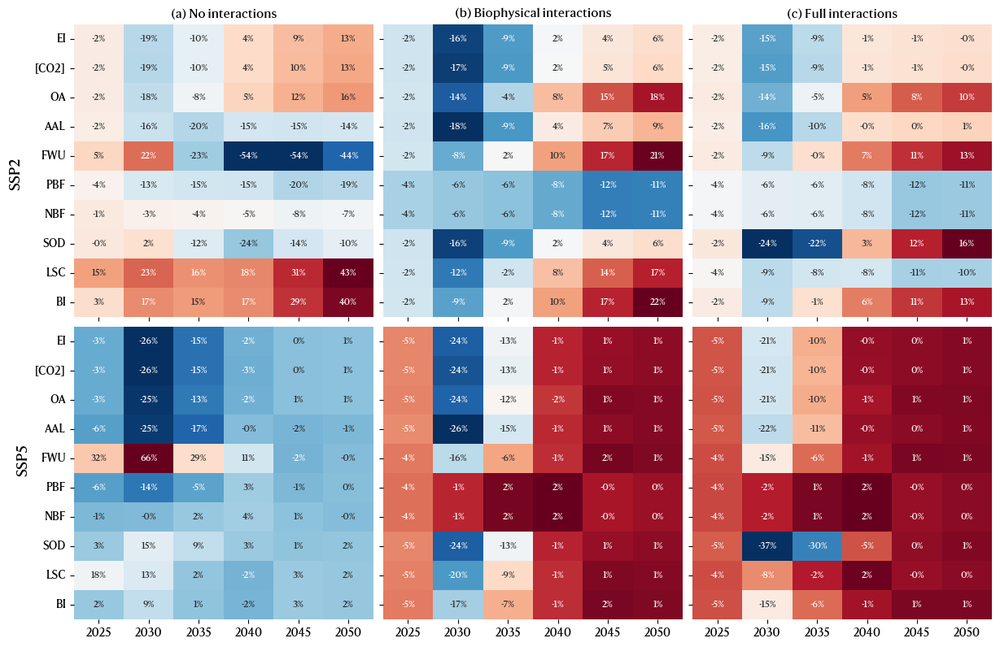

In [172]:
fig, axs = plt.subplots(2,3, figsize=(12,8),sharey=true,sharex=true)

kw_ag_font=Dict("fontproperties"=>font_prop, "fontsize"=> 8)

for (i,k) in enumerate([δASR12_noI,δASR13_noI,δASR12_bio,δASR13_bio,δASR12,δASR13])
    Seaborn.heatmap(hcat(k...),ax=axs[i],cbar=false,annot=true,annot_kws=kw_ag_font, fmt=".0%",cmap="RdBu_r")
    axs[i].set_xticklabels(2025:5:2050,fontproperties=font_prop_labels,fontsize=10) #rotation=45, ha="right",
    axs[i].set_yticklabels(categories_S, rotation=0, ha="right",fontproperties=font_prop_labels,fontsize=10)
end

axs[1,1].set_title("(a) No interactions",fontproperties=font_prop_titles,fontsize=30)
axs[1,2].set_title("(b) Biophysical interactions",fontproperties=font_prop_titles,fontsize=30)
axs[1,3].set_title("(c) Full interactions",fontproperties=font_prop_titles,fontsize=30)

fig.text(-0.01, 0.73, "SSP2", va="center",ha="center", rotation="vertical", fontproperties=font_prop_labels, fontsize=13)
fig.text(-0.01, 0.29, "SSP5", va="center", rotation="vertical", fontproperties=font_prop_labels, fontsize=13)

left = 0.92
bottom = 0.2 #/ (fig_height*0.5)
width = 0.02
height = 0.6
# cbar_ax = fig.add_axes([left, bottom, width, height]) 
# cbar = fig.colorbar(plt.cm.ScalarMappable(cmap="RdBu_r"), cax=cbar_ax)
# cbar.set_label("%", fontproperties=font_prop)
plt.tight_layout()  
# plt.savefig(respath*"ASR_heatmap.svg",transparent=true, bbox_inches="tight")
# plt.savefig(respath*"ASR_heatmap.pdf",transparent=true, bbox_inches="tight")
display(plt.gcf())
plt.close("all")


In [173]:
δASR12_noI= [x./y for (x,y) in zip((ASR_med_noI[:,2].-ASR_med_noI[:,1]),ASR_med_noI[:,1])]
δASR13_noI= [x./y for (x,y) in zip((ASR_med_noI[:,3].-ASR_med_noI[:,1]),ASR_med_noI[:,1])]

δASR12_bio= [x./y for (x,y) in zip((ASR_med_bio[:,2].-ASR_med_bio[:,1]),ASR_med_bio[:,1])]
δASR13_bio= [x./y for (x,y) in zip((ASR_med_bio[:,3].-ASR_med_bio[:,1]),ASR_med_bio[:,1])]

δASR12 = [x./y for (x,y) in zip((ASR_med[:,2].-ASR_med[:,1]),ASR_med[:,1])]
δASR13 = [x./y for (x,y) in zip((ASR_med[:,3].-ASR_med[:,1]),ASR_med[:,1])]


6-element Vector{Vector{Float64}}:
 [-0.04833142576611477, -0.04860324661500593, -0.04801915556668379, -0.05065651276542451, -0.0445113755115795, -0.041201431899945684, -0.041201431899945684, -0.053074830944355444, -0.04399170760755691, -0.04525880455906201]
 [-0.20545087210880836, -0.21053914163432225, -0.21062367459644638, -0.22245710046784564, -0.1542141279144079, -0.019067845987133594, -0.019067845987133594, -0.3658673284783261, -0.07932562915779207, -0.15374537185427747]
 [-0.10039392795284148, -0.10444249756473156, -0.09968917129510266, -0.11183488932209569, -0.06107349549905574, 0.013335803613949666, 0.013335803613949666, -0.30289012786925723, -0.016667380297240714, -0.0605333676504307]
 [-0.0005859755431632547, -0.0012256743858873236, -0.00970527801735134, -0.0015191997486532233, -0.007937316543270493, 0.023292493853888197, 0.023292493853888197, -0.0468914208846901, 0.019388907371006, -0.007526282064108029]
 [0.002741209933501521, 0.002923579066978196, 0.009384024409972224, 0.0

In [174]:
δASRbh1=[x./y for (x,y) in zip((ASR_med[:,1].-ASR_med_bio[:,1]),ASR_med_bio[:,1])]
δASRbh2=[x./y for (x,y) in zip((ASR_med[:,2].-ASR_med_bio[:,2]),ASR_med_bio[:,2])]
δASRbh3=[x./y for (x,y) in zip((ASR_med[:,3].-ASR_med_bio[:,3]),ASR_med_bio[:,3])]


6-element Vector{Vector{Float64}}:
 [0.32908695412865063, 0.3175923616042206, 0.2305884042633386, 0.34105129817566926, 0.38625034137839437, 0.0870351395670765, 0.0870351395670765, -3.266854405560765, 2.8445252879191694, 0.34516054388699524]
 [0.41050234574030703, 0.40011397419394157, 0.27908835637366647, 0.4486932114202508, 0.33765991883900887, 0.06693110306357489, 0.06693110306357489, -2.6376822616838, 3.488524317605892, 0.3310575602712105]
 [0.44196657607869694, 0.4345865838390904, 0.27235986729781264, 0.49590385461747943, 0.260397852603419, 0.05827190133277898, 0.05827190133277898, -2.058802099298873, 3.2365621836445637, 0.2678018756263994]
 [0.44876859713005735, 0.44211522029055617, 0.270350678654685, 0.5052586018217209, 0.24742225337975748, 0.056683345143711455, 0.056683345143711455, -1.9229239647183294, 3.180277004554321, 0.25676422043867436]
 [0.48424498123509213, 0.47769538532217076, 0.30328245833842515, 0.5504225223628328, 0.27699759923886563, 0.05618474674637659, 0.0561847467

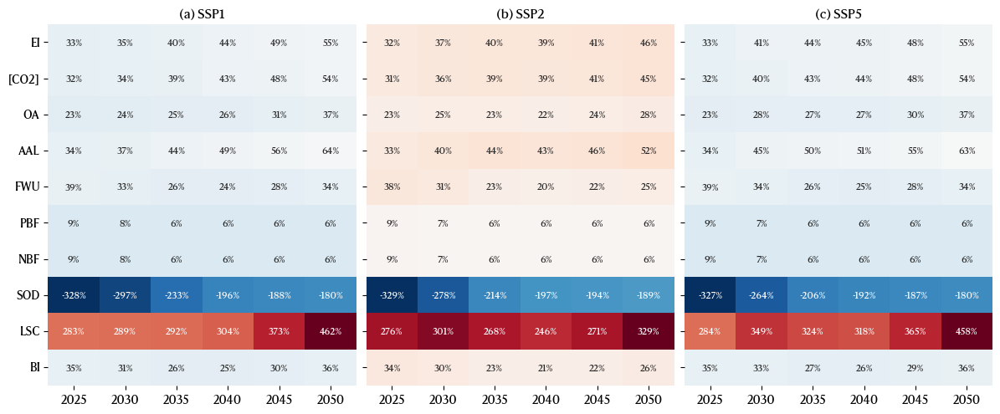

In [175]:
fig, axs = plt.subplots(1,3, figsize=(12,5),sharey=true,sharex=true)

kw_ag_font=Dict("fontproperties"=>font_prop, "fontsize"=> 8)

for (i,k) in enumerate([δASRbh1,δASRbh2,δASRbh3])
    Seaborn.heatmap(hcat(k...),ax=axs[i],cbar=false,annot=true,annot_kws=kw_ag_font, fmt=".0%",cmap="RdBu_r")
    axs[i].set_xticklabels(2025:5:2050,fontproperties=font_prop_labels,fontsize=10) #rotation=45, ha="right",
    axs[i].set_yticklabels(categories_S, rotation=0, ha="right",fontproperties=font_prop_labels,fontsize=10)
end

axs[1].set_title("(a) SSP1",fontproperties=font_prop_titles,fontsize=30)
axs[2].set_title("(b) SSP2",fontproperties=font_prop_titles,fontsize=30)
axs[3].set_title("(c) SSP5",fontproperties=font_prop_titles,fontsize=30)

# fig.text(-0.01, 0.73, "SSP2", va="center",ha="center", rotation="vertical", fontproperties=font_prop_labels, fontsize=13)
# fig.text(-0.01, 0.29, "SSP5", va="center", rotation="vertical", fontproperties=font_prop_labels, fontsize=13)

left = 0.92
bottom = 0.2 #/ (fig_height*0.5)
width = 0.02
height = 0.6
# cbar_ax = fig.add_axes([left, bottom, width, height]) 
# cbar = fig.colorbar(plt.cm.ScalarMappable(cmap="RdBu_r"), cax=cbar_ax)
# cbar.set_label("%", fontproperties=font_prop)
plt.tight_layout()  
# plt.savefig(respath*"ASR_heatmap_bh.svg",transparent=true, bbox_inches="tight")
# plt.savefig(respath*"ASR_heatmap_bh.pdf",transparent=true, bbox_inches="tight")
display(plt.gcf())
plt.close("all")


### ***3.4.4. Sensitivity analysis***

#### ***3.4.4.1 Varying the CCS content***

Biophysical interactions

In [172]:
e_bio=[opti(result_format=:ASR,asos=:median,interactions=:biophysical,c_electrolysis=c_electrolysis,CCS=ones(size(c_electrolysis))*y)[:,1] for y in 0:0.175:35];
e_bio_SSP2=[opti(result_format=:ASR,asos=:median,interactions=:biophysical,c_electrolysis=c_electrolysis,CCS=ones(size(c_electrolysis))*y)[:,2] for y in 0:0.175:35];
e_bio_SSP5=[opti(result_format=:ASR,asos=:median,interactions=:biophysical,c_electrolysis=c_electrolysis,CCS=ones(size(c_electrolysis))*y)[:,3] for y in 0:0.175:35];


In [174]:
function expt_sensitivity(e,catnames,scenar)
    filename = string(respath, "Sensitivity/", scenar, "_results.xlsx")
    if isfile(filename)
        rm(filename)
    end

    for i in enumerate(catnames)
    df_e_bio=DataFrame(hcat(0:0.175:35,[z[y][i[1]] for z in e, y in 1:6]),:auto)
    rename!(df_e_bio, [Symbol("kgCO₂/kgH₂⁻¹"), (Symbol(i) for i in 2025:5:2050)...])
    
    if isfile(filename)
        XLSX.openxlsx(filename, mode="rw") do xf
            if i[2] in XLSX.sheetnames(xf)
                deletesheet!(xf, i[2]) 
            end
            ws = XLSX.addsheet!(xf, i[2])
            XLSX.writetable!(ws, Tables.columntable(df_e_bio))
        end
    else
        XLSX.writetable(filename, Tables.columntable(df_e_bio), sheetname=i[2])
    end
    end
end


expt_sensitivity (generic function with 1 method)

In [175]:
e_full=[opti(result_format=:ASR,asos=:median,
            interactions=:full,c_electrolysis=c_electrolysis,CCS=ones(size(c_electrolysis))*y)[:,1] for y in 0:0.175:35];

e_full_SSP2=[opti(result_format=:ASR,asos=:median,
            interactions=:full,c_electrolysis=c_electrolysis,CCS=ones(size(c_electrolysis))*y)[:,2] for y in 0:0.175:35];

e_full_SSP5=[opti(result_format=:ASR,asos=:median,
            interactions=:full,c_electrolysis=c_electrolysis,CCS=ones(size(c_electrolysis))*y)[:,3] for y in 0:0.175:35];


In [179]:
expt_sensitivity(e_bio,catnames,"SSP1_B-PBI")
expt_sensitivity(e_bio_SSP2,catnames,"SSP2_B-PBI")
expt_sensitivity(e_bio_SSP5,catnames,"SSP5_B-PBI")

expt_sensitivity(e_full,catnames,"SSP1_H-PBI")
expt_sensitivity(e_full_SSP2,catnames,"SSP2_H-PBI")
expt_sensitivity(e_full_SSP5,catnames,"SSP5_H-PBI")


UndefVarError: UndefVarError: `respath` not defined

In [176]:
rcParams["hatch.linewidth"] = 0.1  
rcParams["hatch.color"]    = "k" 


"k"

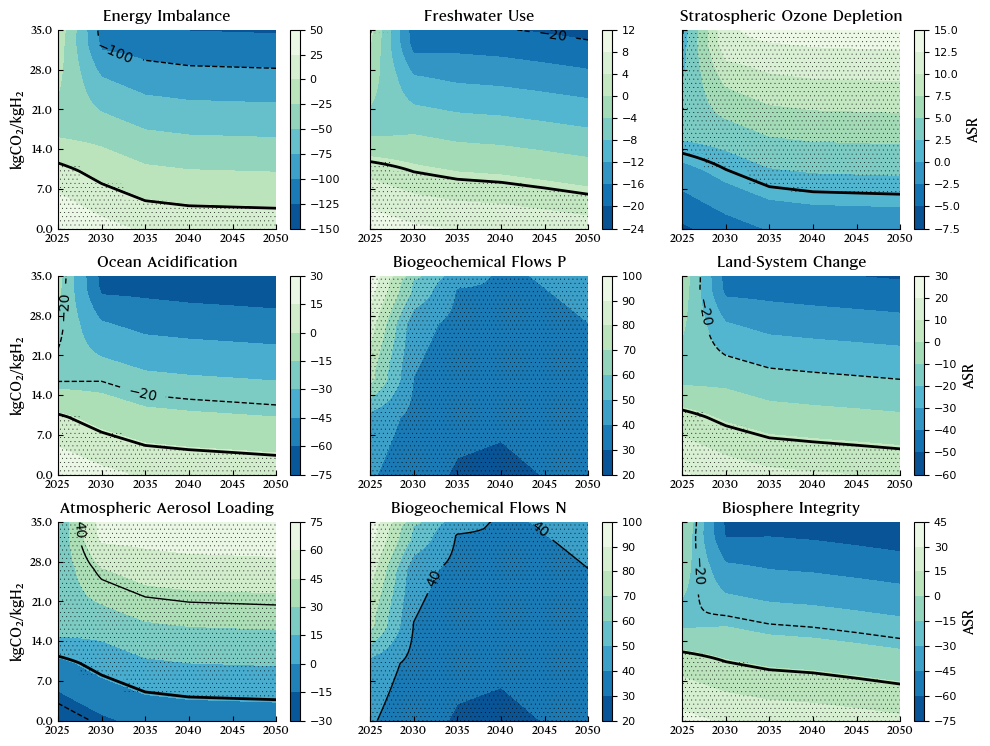

In [177]:
# function 
fig, axs = plt.subplots(3,3,figsize=(10,7.5), sharey=true)
contour_vals=[-100,1,10,100,200,300,400,500]

for (ind,(i,tit)) in enumerate(zip([1,3,4,5,6,7,8,9,10],categories[Not(2)]))
    cs = axs[ind].contourf([z[y][i] for z in e_bio, y in 1:6],cmap="GnBu_r")


    mask_int = Int.([z[y][i] for z in e_bio, y in 1:6] .> 1)

    # c) overlay hatch on that mask
    axs[ind].contourf(
        mask_int,
        [0.5, 1.5];
        hatches=["...."],
        colors="none",
    )

    if ind ==1 || ind==2 || ind==3
        axs[ind].set_ylabel("kgCO₂/kgH₂", fontproperties=font_prop_labels)
    end
    axs[ind].set_title(tit, fontproperties=font_prop_titles) 
    axs[ind].set_xticks(0:5)
    axs[ind].set_xticklabels(2025:5:2050,fontproperties=font_prop_ticks)

    axs[ind].set_yticks(0:1:200)
    axs[ind].set_yticklabels(0:0.175:35,fontproperties=font_prop_ticks)


    cbar = fig.colorbar(cs, ax=axs[ind])
    if ind ==7 || ind==8 || ind==9
    cbar.set_label("ASR", fontproperties=font_prop_labels)
    end
end

axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=5))
axs[2,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=5))
axs[3,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=5))

range800=-1000:300:1000
for (ind,i) in zip([1,5],[1,6])
    cs_lines = axs[ind].contour([z[y][i] for z in e_bio, y in 1:6], levels=range800, linewidths=1,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10)
end

range50=-140:60:140
for (ind,i) in zip([2,3,4,6,7,8,9],[3,4,5,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in e_bio, y in 1:6], levels=range50, linewidths=1,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10)
end

for (ind,i) in enumerate([1,3,4,5,6,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in e_bio, y in 1:6], levels=[1], linewidths=2,colors="black")
    # axs[ind].clabel(cs_lines, inline=1, fontsize=10,fmt=Dict(1=> "aSOS"))
end

for ax in axs
    ax.tick_params(axis="both", direction="in")
    ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
end
plt.tight_layout()
plt.savefig("ASR_sens_B-PBI.svg",transparent=true)
plt.savefig("ASR_sens_B-PBI.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


Full range of interactions

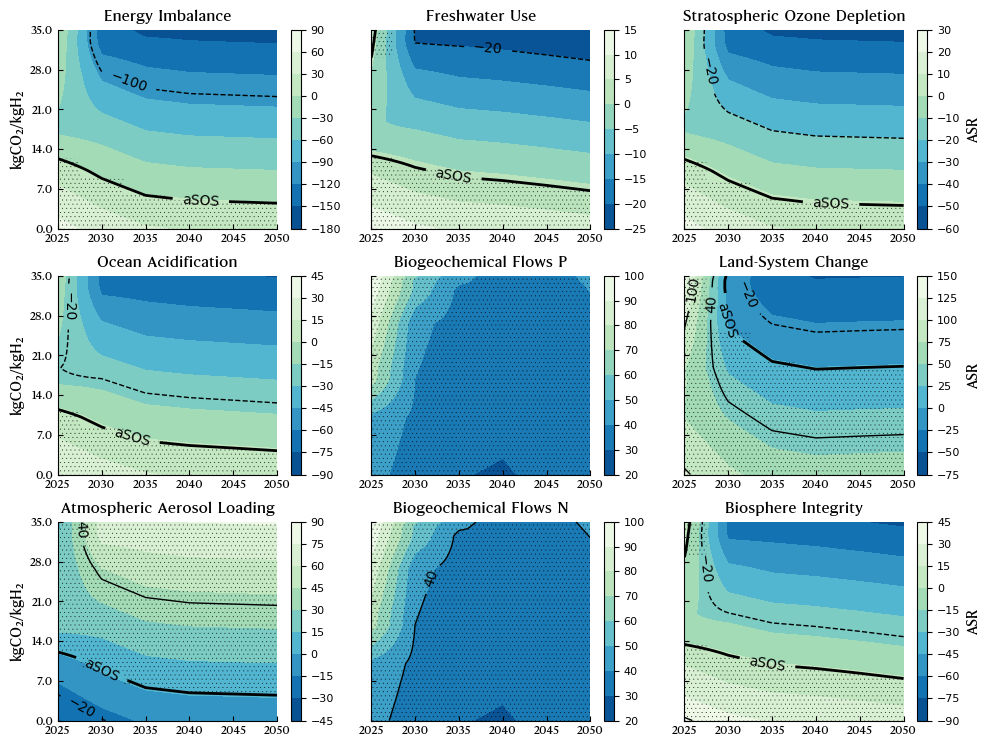

In [178]:
fig, axs = plt.subplots(3,3,figsize=(10,7.5), sharey=true)
contour_vals=[-100,1,10,100,200,300,400,500]

for (ind,(i,tit)) in enumerate(zip([1,3,4,5,6,7,8,9,10],categories[Not(2)]))
    cs = axs[ind].contourf([z[y][i] for z in e_full, y in 1:6],cmap="GnBu_r")

        mask_int = Int.([z[y][i] for z in e_full, y in 1:6] .> 1)

    # c) overlay hatch on that mask
    axs[ind].contourf(
        mask_int,
        [0.5, 1.5];
        hatches=["...."],
        colors="none",
    )
    if ind ==1 || ind==2 || ind==3
        axs[ind].set_ylabel("kgCO₂/kgH₂", fontproperties=font_prop_labels)
    end
    axs[ind].set_title(tit, fontproperties=font_prop_titles) 
    axs[ind].set_xticks(0:5)
    axs[ind].set_xticklabels(2025:5:2050,fontproperties=font_prop_ticks)

    axs[ind].set_yticks(0:1:200)
    axs[ind].set_yticklabels(0:0.175:35,fontproperties=font_prop_ticks)


    cbar = fig.colorbar(cs, ax=axs[ind])
    if ind ==7 || ind==8 || ind==9
    cbar.set_label("ASR", fontproperties=font_prop_labels)
    end
end

range800=-1000:300:1000
for (ind,i) in zip([1,5],[1,6])
    cs_lines = axs[ind].contour([z[y][i] for z in e_full, y in 1:6], levels=range800, linewidths=1,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10)
end

range50=-140:60:140
for (ind,i) in zip([2,3,4,6,7,8,9],[3,4,5,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in e_full, y in 1:6], levels=range50, linewidths=1,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10)
end

for (ind,i) in enumerate([1,3,4,5,6,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in e_full, y in 1:6], levels=[1], linewidths=2,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10,fmt=Dict(1=> "aSOS"))
end


for ax in axs
    ax.tick_params(axis="both", direction="in")
    ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
end

axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=5))
axs[2,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=5))
axs[3,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=5))

plt.tight_layout()
# plt.savefig(respath*"Sensitivity/ASR_sens_H-PBI.svg",transparent=true)
# plt.savefig(respath*"Sensitivity/ASR_sens_H-PBI.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


#### ***3.4.4.2 Varying the electrolysis capacity: Hydroelectricity***

In [179]:
share = 1#0.8
cc=[12.440041460692076, 9.114176367405518, 6.1845798118322435, 5.552224525594005, 5.190001594642003, 4.891963004305533].*share
nmax=2
pt=500


500

In [180]:
h_bio=[opti(result_format=:ASR,asos=:median,interactions=:biophysical,
        c_electrolysis=c_electrolysis*y,
        c_nuclear_electricity=c_nuclear_electricity,
        c_wind_electricity=c_wind_electricity,
        c_hydro_electricity=c_hydro_electricity*1e60,
        c_solar_electricity=c_solar_electricity,
        c_solar_PV_electricity=c_solar_PV_electricity,
        C_PEM=ones(size(c_electrolysis)),#C_PEM,
        C_AEC=C_AEC,
        C_SOEC=C_SOEC,
        CCS=hcat(cc,cc,cc)
        )[:,1] for y in 1:(nmax-1)/pt:nmax];


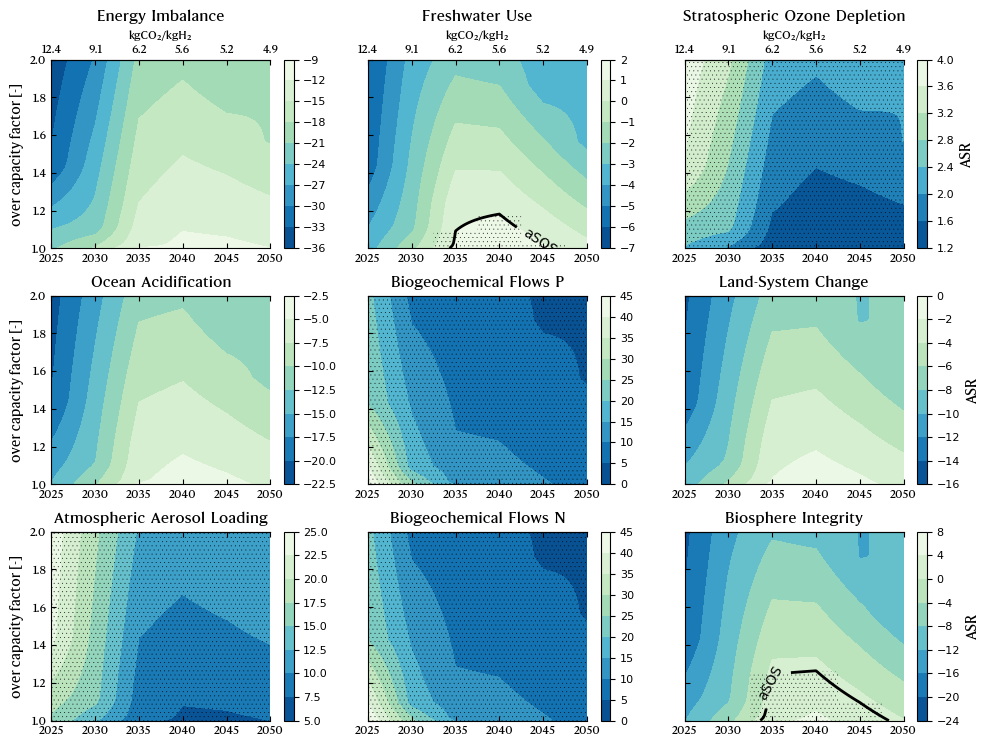

In [186]:
fig, axs = plt.subplots(3,3,figsize=(10,7.5), sharey=true)
contour_vals=[-100,1,10,100,200,300,400,500]
sax=nothing
for (ind,(i,tit)) in enumerate(zip([1,3,4,5,6,7,8,9,10],categories[Not(2)]))
    cs = axs[ind].contourf([z[y][i] for z in h_bio, y in 1:6],cmap="GnBu_r")

    mask_int = Int.([z[y][i] for z in h_bio, y in 1:6] .> 1)

    # c) overlay hatch on that mask
    axs[ind].contourf(
        mask_int,
        [0.5, 1.5];
        hatches=["...."],
        colors="none",
    )
    if ind ==1 || ind==2 || ind==3
        axs[ind].set_ylabel("over capacity factor [-]", fontproperties=font_prop_labels)
    end
    axs[ind].set_title(tit, fontproperties=font_prop_titles) 
    axs[ind].set_xticks(0:5)
    axs[ind].set_xticklabels(2025:5:2050,fontproperties=font_prop_ticks)
    axs[ind].set_yticks(0:1:pt)
    axs[ind].set_yticklabels(1:(nmax-1)/pt:nmax,fontproperties=font_prop_ticks)

    secax = axs[ind].secondary_xaxis("top")
    secax.tick_params(axis="x", direction="in", zorder=10)
    secax.set_zorder(10)
    if ind ==1 || ind==4 || ind==7
        secax.set_xlabel("kgCO₂/kgH₂", fontproperties=font_prop, fontsize=8)
        secax.set_xticks(0:5)
        secax.set_xticklabels(round.(cc,digits=1),fontproperties=font_prop_ticks)
    else
        secax.set_xticks(0:5)
        secax.set_xticklabels([], fontproperties=font_prop_ticks)
    end
    cbar = fig.colorbar(cs, ax=axs[ind])
    if ind ==7 || ind==8 || ind==9
        cbar.set_label("ASR", fontproperties=font_prop_labels)
        end
    end

for (ind,i) in enumerate([1,3,4,5,6,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in h_bio, y in 1:6], levels=[1], linewidths=2,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10,fmt=Dict(1=> "aSOS"))
end

# sax.tick_params(axis="y", direction="out")
for ax in axs
    ax.tick_params(axis="both", direction="in")
    # ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
end
axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[2,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[3,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))

plt.tight_layout()
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_B-PBI_hydroelectricity.svg",transparent=true)
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_B-PBI_hydroelectricity.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


Sensitivity on the full range of interactions.

In [184]:
h_full=[opti(result_format=:ASR,asos=:median,interactions=:full,
        c_electrolysis=c_electrolysis*y,
        c_nuclear_electricity=c_nuclear_electricity,
        c_wind_electricity=c_wind_electricity,
        c_hydro_electricity=c_hydro_electricity*1e60,
        c_solar_electricity=c_solar_electricity,
        c_solar_PV_electricity=c_solar_PV_electricity,
        C_PEM=ones(size(c_electrolysis)),#C_PEM,
        C_AEC=C_AEC,
        C_SOEC=C_SOEC,
        CCS=hcat(cc,cc,cc)
        )[:,1] for y in 1:(nmax-1)/pt:nmax];


In [183]:
fig, axs = plt.subplots(3,3,figsize=(10,7.5), sharey=true)
contour_vals=[-100,1,10,100,200,300,400,500]
sax=nothing

for (ind,(i,tit)) in enumerate(zip([1,3,4,5,6,7,8,9,10],categories[Not(2)]))
    cs = axs[ind].contourf([z[y][i] for z in h_full, y in 1:6],cmap="GnBu_r")
    if ind ==1 || ind==2 || ind==3
        axs[ind].set_ylabel("over capacity factor [-]", fontproperties=font_prop_labels)
    end
    axs[ind].set_title(tit, fontproperties=font_prop_titles) 
    axs[ind].set_xticks(0:5)
    axs[ind].set_xticklabels(2025:5:2050,fontproperties=font_prop_ticks)
    axs[ind].set_yticks(0:1:pt)
    axs[ind].set_yticklabels(1:(nmax-1)/pt:nmax,fontproperties=font_prop_ticks)

    secax = axs[ind].secondary_xaxis("top")
    secax.tick_params(axis="x", direction="in", zorder=10)
    secax.set_zorder(10)
    if ind ==1 || ind==4 || ind==7
        secax.set_xlabel("kgCO₂/kgH₂", fontproperties=font_prop, fontsize=8)
        secax.set_xticks(0:5)
        secax.set_xticklabels(round.(cc),fontproperties=font_prop_ticks)
    else
        secax.set_xticks(0:5)
        secax.set_xticklabels([], fontproperties=font_prop_ticks)
    end
    cbar = fig.colorbar(cs, ax=axs[ind])
    if ind ==7 || ind==8 || ind==9
        cbar.set_label("ASR", fontproperties=font_prop_labels)
        end
    end

for (ind,i) in enumerate([1,3,4,5,6,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in h_full, y in 1:6], levels=[1], linewidths=2,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10,fmt=Dict(1=> "aSOS"))
end

# sax.tick_params(axis="y", direction="out")
for ax in axs
    ax.tick_params(axis="both", direction="in")
    # ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
end

axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[2,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[3,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))


plt.tight_layout()
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_H-PBI_hydroelectricity.svg",transparent=true)
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_H-PBI_hydroelectricity.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


UndefVarError: UndefVarError: `h_full` not defined

#### ***3.4.4.3 Varying the electrolysis capacity: nuclear***

Sensitivity on the biophysical scenario

In [188]:
share = 1#0.8
cc=[12.440041460692076, 9.114176367405518, 6.1845798118322435, 5.552224525594005, 5.190001594642003, 4.891963004305533].*share
nmax=2
pt=500


500

In [189]:
h_bio=[opti(result_format=:ASR,asos=:median,interactions=:biophysical,
        c_electrolysis=c_electrolysis*y,
        c_nuclear_electricity=c_nuclear_electricity*1e60,
        c_wind_electricity=c_wind_electricity,
        c_hydro_electricity=c_hydro_electricity,
        c_solar_electricity=c_solar_electricity,
        c_solar_PV_electricity=c_solar_PV_electricity,
        C_PEM=ones(size(c_electrolysis)),#C_PEM,
        C_AEC=C_AEC,
        C_SOEC=C_SOEC,
        CCS=hcat(cc,cc,cc)
        )[:,1] for y in 1:(nmax-1)/pt:nmax];


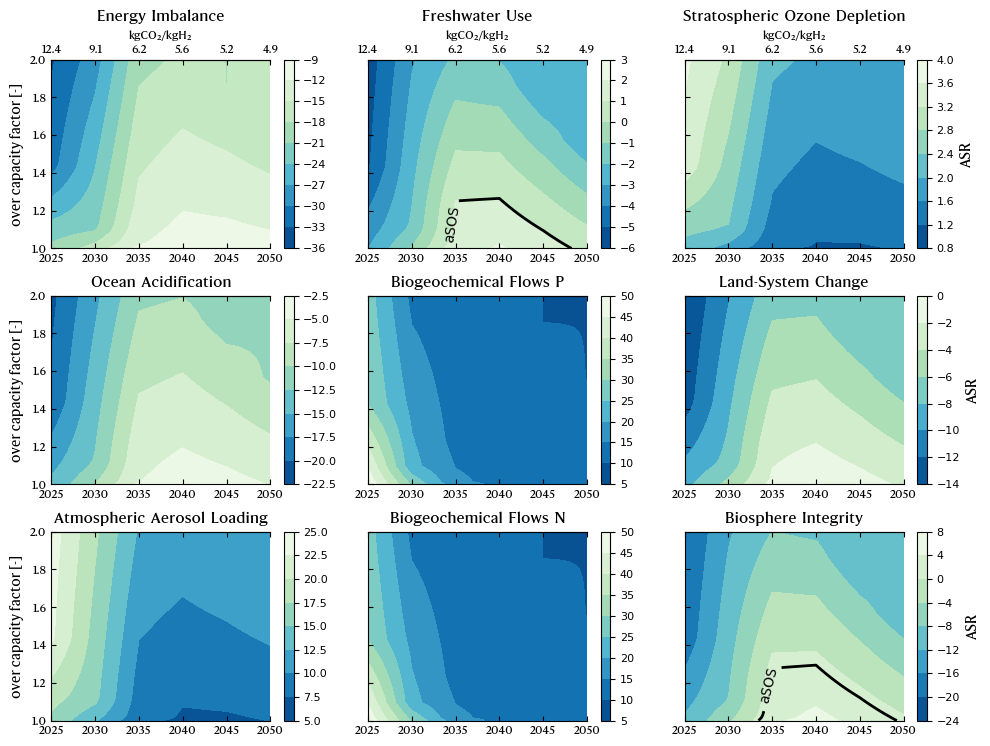

In [190]:
fig, axs = plt.subplots(3,3,figsize=(10,7.5), sharey=true)
contour_vals=[-100,1,10,100,200,300,400,500]
sax=nothing
for (ind,(i,tit)) in enumerate(zip([1,3,4,5,6,7,8,9,10],categories[Not(2)]))
    cs = axs[ind].contourf([z[y][i] for z in h_bio, y in 1:6],cmap="GnBu_r")
    if ind ==1 || ind==2 || ind==3
        axs[ind].set_ylabel("over capacity factor [-]", fontproperties=font_prop_labels)
    end
    axs[ind].set_title(tit, fontproperties=font_prop_titles) 
    axs[ind].set_xticks(0:5)
    axs[ind].set_xticklabels(2025:5:2050,fontproperties=font_prop_ticks)
    axs[ind].set_yticks(0:1:pt)
    axs[ind].set_yticklabels(1:(nmax-1)/pt:nmax,fontproperties=font_prop_ticks)

    secax = axs[ind].secondary_xaxis("top")
    secax.tick_params(axis="x", direction="in", zorder=10)
    secax.set_zorder(10)
    if ind ==1 || ind==4 || ind==7
        secax.set_xlabel("kgCO₂/kgH₂", fontproperties=font_prop, fontsize=8)
        secax.set_xticks(0:5)
        secax.set_xticklabels(round.(cc,digits=1),fontproperties=font_prop_ticks)
    else
        secax.set_xticks(0:5)
        secax.set_xticklabels([], fontproperties=font_prop_ticks)
    end
    cbar = fig.colorbar(cs, ax=axs[ind])
    if ind ==7 || ind==8 || ind==9
        cbar.set_label("ASR", fontproperties=font_prop_labels)
        end
    end

for (ind,i) in enumerate([1,3,4,5,6,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in h_bio, y in 1:6], levels=[1], linewidths=2,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10,fmt=Dict(1=> "aSOS"))
end

# sax.tick_params(axis="y", direction="out")
for ax in axs
    ax.tick_params(axis="both", direction="in")
    # ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
end
axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[2,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[3,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))

plt.tight_layout()
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_B-PBI_nuclear.svg",transparent=true)
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_B-PBI_nuclear.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


Sensitivity on the full range of interactions.

In [191]:
h_full=[opti(result_format=:ASR,asos=:median,interactions=:full,
        c_electrolysis=c_electrolysis*y,
        c_nuclear_electricity=c_nuclear_electricity*1e60,
        c_wind_electricity=c_wind_electricity,
        c_hydro_electricity=c_hydro_electricity,
        c_solar_electricity=c_solar_electricity,
        c_solar_PV_electricity=c_solar_PV_electricity,
        C_PEM=ones(size(c_electrolysis)),#C_PEM,
        C_AEC=C_AEC,
        C_SOEC=C_SOEC,
        CCS=hcat(cc,cc,cc)
        )[:,1] for y in 1:(nmax-1)/pt:nmax];


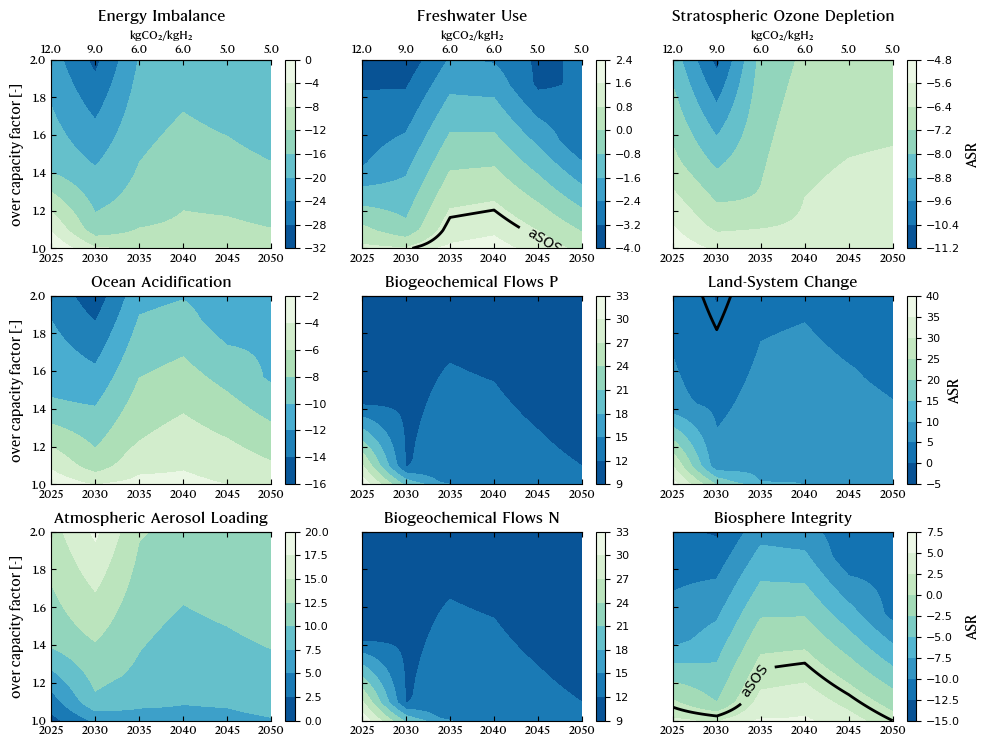

In [192]:
fig, axs = plt.subplots(3,3,figsize=(10,7.5), sharey=true)
contour_vals=[-100,1,10,100,200,300,400,500]
sax=nothing

for (ind,(i,tit)) in enumerate(zip([1,3,4,5,6,7,8,9,10],categories[Not(2)]))
    cs = axs[ind].contourf([z[y][i] for z in h_full, y in 1:6],cmap="GnBu_r")
    if ind ==1 || ind==2 || ind==3
        axs[ind].set_ylabel("over capacity factor [-]", fontproperties=font_prop_labels)
    end
    axs[ind].set_title(tit, fontproperties=font_prop_titles) 
    axs[ind].set_xticks(0:5)
    axs[ind].set_xticklabels(2025:5:2050,fontproperties=font_prop_ticks)
    axs[ind].set_yticks(0:1:pt)
    axs[ind].set_yticklabels(1:(nmax-1)/pt:nmax,fontproperties=font_prop_ticks)

    secax = axs[ind].secondary_xaxis("top")
    secax.tick_params(axis="x", direction="in", zorder=10)
    secax.set_zorder(10)
    if ind ==1 || ind==4 || ind==7
        secax.set_xlabel("kgCO₂/kgH₂", fontproperties=font_prop, fontsize=8)
        secax.set_xticks(0:5)
        secax.set_xticklabels(round.(cc),fontproperties=font_prop_ticks)
    else
        secax.set_xticks(0:5)
        secax.set_xticklabels([], fontproperties=font_prop_ticks)
    end
    cbar = fig.colorbar(cs, ax=axs[ind])
    if ind ==7 || ind==8 || ind==9
        cbar.set_label("ASR", fontproperties=font_prop_labels)
        end
    end

for (ind,i) in enumerate([1,3,4,5,6,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in h_full, y in 1:6], levels=[1], linewidths=2,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10,fmt=Dict(1=> "aSOS"))
end

# sax.tick_params(axis="y", direction="out")
for ax in axs
    ax.tick_params(axis="both", direction="in")
    # ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
end

axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[2,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[3,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))


plt.tight_layout()
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_H-PBI_nuclear.svg",transparent=true)
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_H-PBI_nuclear.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


# **References**

# **Acknowledgments**

In [ ]:
Saving.(𝐏) #function to save the computed values.


In [ ]:
# Material requirements
# SC_Ir is the specific iridium consumption (kg_ir/kg_H2), and s_PEM is the required scale of hydrogen production from PEM electrolysis (kg_H2). 
# █(〖Cons〗_k=(s_PEM SC_Ir)/1000  [t_Ir ]#(17) )
# Make the figure. 
